<a href="https://colab.research.google.com/github/frnocentini/brain-tumor-object-dectection/blob/main/ResNet101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd '/content/drive/MyDrive/dataset brain tumor/dataset'


/content/drive/.shortcut-targets-by-id/1LSYxqUtErLWfbOg3Kht_4Q02IsWLPY5r/dataset brain tumor/dataset


In [3]:
!unzip 'axial_t1wce_2_class' -d '/dataset unzipped'

Archive:  axial_t1wce_2_class.zip
  inflating: /dataset unzipped/axial_t1wce_2_class/axial_t1wce_2_class.yaml  
   creating: /dataset unzipped/axial_t1wce_2_class/images/
   creating: /dataset unzipped/axial_t1wce_2_class/images/test/
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_101.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_109.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_111.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_117.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_121.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_126.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00018_134.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_66.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/images/test/00019_75.jpg  
  inflating: /dataset unzipped/axial_t1wce_2_class/image

In [4]:
!unzip 'coronal_t1wce_2_class' -d '/dataset unzipped'

Archive:  coronal_t1wce_2_class.zip
  inflating: /dataset unzipped/coronal_t1wce_2_class/coronal_t1wce_2_class.yaml  
   creating: /dataset unzipped/coronal_t1wce_2_class/images/
   creating: /dataset unzipped/coronal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/13.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/15.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/17.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/19.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/20.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/23.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/33.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/34.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/35.jpg  
  inflating: /dataset unzipped/coronal_t1wce_2_class/images/test/36.jpg  
  inflating: /d

In [5]:
!unzip 'sagittal_t1wce_2_class' -d '/dataset unzipped'

Archive:  sagittal_t1wce_2_class.zip
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/
   creating: /dataset unzipped/sagittal_t1wce_2_class/images/test/
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_102.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_121.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_140.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00000_159.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_110.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_129.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_147.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00002_166.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_154.jpg  
  inflating: /dataset unzipped/sagittal_t1wce_2_class/images/test/00003_173.jpg  
  inflating: /

In [6]:
# Data Manipulation
import numpy as np
import pandas as pd
import os
# Visualization/Image Processing
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
# Machine Learning
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, BatchNormalization, Flatten, MaxPool2D, Dense, Activation
from PIL import Image
# Other
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
import xml.etree.ElementTree as ET
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
import imutils

In [7]:
%cd '/dataset unzipped'

/dataset unzipped


In [8]:
def crop_brain_contour(image, plot=False):
    
    #import imutils
    #import cv2
    #from matplotlib import pyplot as plt
    
    # Convert the image to grayscale, and blur it slightl
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Threshold the image, then perform a series of erosions +
    # dilations to remove any small regions of noise
    #thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)
    thresh = cv2.threshold(gray, 30, 255, cv2.THRESH_BINARY)[1]
    #thresh = cv2.erode(thresh, None, iterations=2)
    #thresh = cv2.dilate(thresh, None, iterations=2)

    # Find contours in thresholded image, then grab the largest one
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)
    

    # Find the extreme points
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])
    
    # crop new image out of the original image using the four extreme points (left, right, top, bottom)
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]            

    if plot:
        plt.figure()

        plt.subplot(1, 2, 1)
        plt.imshow(image)
        
        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        
        plt.title('Original Image')
            
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)

        plt.tick_params(axis='both', which='both', 
                        top=False, bottom=False, left=False, right=False,
                        labelbottom=False, labeltop=False, labelleft=False, labelright=False)

        plt.title('Cropped Image')
        
        plt.show()
    
    return new_image,extLeft,extRight,extTop,extBot

In [9]:
#Bounding box with one tumor
lab = ['axial_t1wce_2_class','coronal_t1wce_2_class', 'sagittal_t1wce_2_class']
X_train = []
bb = []
count = 0;
temp_array  = []
extLeft_coords_x = []
extLeft_coords_y = []
extRight_coords_x = []
extRight_coords_y = []
extTop_coords_x = []
extTop_coords_y = []
extBot_coords_x = []
extBot_coords_y = []
image_width = []
image_height = []


extLeft_coords_x_test = []
extLeft_coords_y_test = []
extRight_coords_x_test = []
extRight_coords_y_test = []
extTop_coords_x_test = []
extTop_coords_y_test = []
extBot_coords_x_test = []
extBot_coords_y_test = []
images_width_test = []
images_height_test = []
width_new_im = []
height_new_im = []
traslazione_x_test = []
traslazione_y_test = []

image_size = 224

for i in lab:
    folderPath = os.path.join('./',i,'images','train')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        image_width.append(img.shape[1])
        image_height.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image,extLeft,extRight,extTop,extBot = crop_brain_contour(img,False)
        extLeft_coords_x.append(extLeft[0])
        extLeft_coords_y.append(extLeft[1])
        extRight_coords_x.append(extRight[0])
        extRight_coords_y.append(extRight[1])
        extTop_coords_x.append(extTop[0])
        extTop_coords_y.append(extTop[1])
        extBot_coords_x.append(extBot[0])
        extBot_coords_y.append(extBot[1])
        # resize image
        image = cv2.resize(image, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        #if img.shape[0] != img.shape[1]:
            #img = make_square(img, fill_color=(0, 0, 0, 0))
        #img = cv2.resize(img,(image_size, image_size))
        X_train.append(image)

image_index = 0
#bb_train = np.zeros((len(X_train),4))
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','train')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                 
                temp_array[0] = temp_array[0]*image_width[count] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x[count]
                temp_array[0] = (temp_array[0]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                temp_array[1] = temp_array[1]*image_height[count]
                temp_array[1] = temp_array[1]-extTop_coords_y[count]
                temp_array[1] = (temp_array[1]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size
                
                temp_array[2] = temp_array[2]*(image_width[count])
                temp_array[2] = (temp_array[2]/(extRight_coords_x[count]-extLeft_coords_x[count]))*image_size
                
                
                temp_array[3] = temp_array[3]*(image_height[count])
                temp_array[3] = (temp_array[3]/(extBot_coords_y[count]-extTop_coords_y[count]))*image_size                 
            
                lbls_array.append(temp_array)

                #print(temp_array)
                #bb_train[image_index] = np.array([temp_array])
                #print(bb_train[image_index])

            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count += 1

#Codice per duplicare le immagini con due bounding box
print('Dimensione delle liste prima di duplicare le immagini:')
print('X_train: ', len(X_train))
print('bb_list: ', len(bb_list))

for i in range(len(X_train)):
  if(len(duplicate_img[i]) == 2):
    X_train.append(X_train[i])
    bb_list.append(duplicate_img[i][0])  #dentro bb_list è già stata inserita la seconda label, quindi ora insieriamo la prima per l'immagine duplicata
bb_train = np.zeros((len(X_train),4))

for j in range(len(bb_list)):
  bb_train[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimensione delle liste dopo la duplicazione delle immagini:')
print('X_train: ', len(X_train))
print('bb_train: ', len(bb_train))

X_test = []
for i in lab:
    folderPath = os.path.join('./',i,'images','test')
    for j in sorted(os.listdir(folderPath)):
        #load the image
        img = cv2.imread(os.path.join(folderPath,j))
        images_width_test.append(img.shape[1])
        images_height_test.append(img.shape[0])
        # crop the brain and ignore the unnecessary rest part of the image
        image_test,extLeft_test,extRight_test,extTop_test,extBot_test = crop_brain_contour(img,False)
        extLeft_coords_x_test.append(extLeft_test[0])
        extLeft_coords_y_test.append(extLeft_test[1])
        extRight_coords_x_test.append(extRight_test[0])
        extRight_coords_y_test.append(extRight_test[1])
        extTop_coords_x_test.append(extTop_test[0])
        extTop_coords_y_test.append(extTop_test[1])
        extBot_coords_x_test.append(extBot_test[0])
        extBot_coords_y_test.append(extBot_test[1])
        # resize image
        image_test = cv2.resize(image_test, dsize=(image_size, image_size), interpolation=cv2.INTER_CUBIC)
        #if img.shape[0] != img.shape[1]:
            #img = make_square(img, fill_color=(0, 0, 0, 0))
        #img = cv2.resize(img,(image_size, image_size))
        X_test.append(image_test)

image_index = 0
count_test = 0;
#bb_test = np.zeros((len(X_test),4))
bb_list = []
duplicate_img = []
for i in lab:
    labelsPath = os.path.join('./',i,'labels','test')
    for j in sorted(os.listdir(labelsPath)):
        with open(os.path.join(labelsPath,j), encoding="utf-8") as f:
            lbls_array = []
            for line in f:
                num = list(map(float,line.split(" ")))
                temp_array = []
                for k in num:
                    temp_array.append(k)
                temp_array.pop(0)
                #width_new_im.append(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test])
                #height_new_im.append(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test])
                
                
                temp_array[0] = temp_array[0]*images_width_test[count_test] #centro x immagine originale
                temp_array[0] = temp_array[0]-extLeft_coords_x_test[count_test]
                temp_array[0] = (temp_array[0]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                temp_array[1] = temp_array[1]*images_height_test[count_test]
                temp_array[1] = temp_array[1]-extTop_coords_y_test[count_test]
                temp_array[1] = (temp_array[1]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size
                
                temp_array[2] = temp_array[2]*(images_width_test[count_test])
                temp_array[2] = (temp_array[2]/(extRight_coords_x_test[count_test]-extLeft_coords_x_test[count_test]))*image_size
                
                
                temp_array[3] = temp_array[3]*(images_height_test[count_test])
                temp_array[3] = (temp_array[3]/(extBot_coords_y_test[count_test]-extTop_coords_y_test[count_test]))*image_size                 
            
                lbls_array.append(temp_array)

                #bb_test[image_index] = np.array([temp_array])
                #print(bb_test[image_index])

            bb_list.append(temp_array)
            duplicate_img.append(lbls_array)
            image_index += 1
            count_test += 1

#Codice per duplicare le immagini con due bounding box
print('Dimensione delle liste prima di duplicare le immagini:')
print('X_test: ', len(X_test))
print('bb_list: ', len(bb_list))

for i in range(len(X_test)):
  if(len(duplicate_img[i]) == 2):
    X_test.append(X_test[i])
    bb_list.append(duplicate_img[i][0])  #dentro bb_list è già stata inserita la seconda label, quindi ora insieriamo la prima per l'immagine duplicata

bb_test = np.zeros((len(X_test),4))

for j in range(len(bb_test)):
  bb_test[j] = np.array([bb_list[j]])

#Dimensione delle liste dopo la duplicazione delle immagini:
print('Dimensione delle liste dopo la duplicazione delle immagini:')
print('X_test: ', len(X_test))
print('bb_test: ', len(bb_test))

#print(bb_test[30])
#print(extRight_coords_x_test[30])
#print(extLeft_coords_x_test[30])

Dimensione delle liste prima di duplicare le immagini:
X_train:  878
bb_list:  878
Dimensione delle liste dopo la duplicazione delle immagini:
X_train:  919
bb_train:  919
Dimensione delle liste prima di duplicare le immagini:
X_test:  223
bb_list:  223
Dimensione delle liste dopo la duplicazione delle immagini:
X_test:  237
bb_test:  237


In [10]:
len(X_train)

919

In [11]:
#prepare dataset 
train_dataset = ImageDataGenerator()
val_dataset = ImageDataGenerator()
test_dataset = ImageDataGenerator()

In [12]:
#array conversion
X_train = np.array(X_train)
X_test = np.array(X_test)

In [13]:
#Shuffle
X_train, bb_train = shuffle(X_train, bb_train)

In [14]:
#Validation set created
X_train, X_val, bb_train, bb_val = train_test_split(X_train, bb_train, test_size = 0.1, shuffle = False)

In [15]:
BATCH_SIZE = 16
#save_path = os.path.join('./', 'model_effnet')
train_dataset = train_dataset.flow(X_train, bb_train, batch_size = BATCH_SIZE)
val_dataset = val_dataset.flow(X_val, bb_val, batch_size = BATCH_SIZE)
test_dataset = test_dataset.flow(X_test, bb_test, batch_size = BATCH_SIZE)

In [16]:

def raw_iou(y_true, y_pred):
    results = []
    for i in range(0,y_true.shape[0]):


        boxTrue_width = y_true[i,2]
        boxTrue_height = y_true[i,3]
        x_boxTrue_tleft = y_true[i,0]-boxTrue_width/2  # numpy index selection
        y_boxTrue_tleft = y_true[i,1]-boxTrue_height/2
    
        area_boxTrue = (boxTrue_width * boxTrue_height)

        # boxPred
        boxPred_width = y_pred[i,2]
        boxPred_height = y_pred[i,3]
        x_boxPred_tleft = y_pred[i,0]-boxPred_width/2  
        y_boxPred_tleft = y_pred[i,1]-boxPred_height/2
    
        area_boxPred = (boxPred_width * boxPred_height)


        # calculate the bottom right coordinates for boxTrue and boxPred

        # boxTrue
        x_boxTrue_br = x_boxTrue_tleft + boxTrue_width
        y_boxTrue_br = y_boxTrue_tleft + boxTrue_height # Version 2 revision

        # boxPred
        x_boxPred_br = x_boxPred_tleft + boxPred_width
        y_boxPred_br = y_boxPred_tleft + boxPred_height # Version 2 revision


        # calculate the top left and bottom right coordinates for the intersection box, boxInt

        # boxInt - top left coords
        x_boxInt_tleft = np.max([x_boxTrue_tleft,x_boxPred_tleft])
        y_boxInt_tleft = np.max([y_boxTrue_tleft,y_boxPred_tleft]) # Version 2 revision

        # boxInt - bottom right coords
        x_boxInt_br = np.min([x_boxTrue_br,x_boxPred_br])
        y_boxInt_br = np.min([y_boxTrue_br,y_boxPred_br]) 

        # Calculate the area of boxInt, i.e. the area of the intersection 
        # between boxTrue and boxPred.
        # The np.max() function forces the intersection area to 0 if the boxes don't overlap.
        
        
        # Version 2 revision
        area_of_intersection = \
        np.max([0,(x_boxInt_br - x_boxInt_tleft)]) * np.max([0,(y_boxInt_br - y_boxInt_tleft)])

        iou = np.mean(area_of_intersection / ((area_boxTrue + area_boxPred) - area_of_intersection)).astype(np.float32)


        # This must match the type used in py_func
        results.append(iou)
    return np.mean(results)

def IoU(y_true, y_pred):
    iou = tf.numpy_function(raw_iou, [y_true, y_pred], tf.float32)
    return iou



In [17]:
#def iou(y_true,y_pred):
  #pred_bbox_val = model.predict(X_val)
  #iou = tf.numpy_function(calculate_iou,[y_true,y_pred],tf.float32)
  #return iou

In [18]:
# Draw the predicted bounding boxes
def display_image(img, bbox_coords, pred_coords):
    if len(bbox_coords) == 4: #in rosso
        xmin, ymin, width, height = bbox_coords
        img = cv2.rectangle(img, (int(xmin-width/2), int(ymin-height/2)), (int(xmin+width/2), int(ymin+height/2)), (255, 0, 0), 1)
        #img = cv2.rectangle(img, (0,0),(10,10), (0, 0, 255), 1)
    if len(pred_coords) == 4: #in verde
        xmin1, ymin1, width1, height1 = pred_coords
        img = cv2.rectangle(img, (int(xmin1-width1/2), int(ymin1-height1/2)), (int(xmin1+width1/2), int(ymin1+height1/2)), (0, 255, 0), 1)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

In [19]:
#To test the model
def test_model(model):
    rand_index = np.random.randint(0, bb_test.shape[0])
    pred_bbox = model.predict(X_test)[rand_index]
    img_original = X_test[rand_index]
    img = img_original.copy()
    coords = bb_test[rand_index]
    #example, label = next(datagen)
    #X = example['image']
    #y = label['coords']
    #pred_bbox = model.predict(X)[0]
    #img = X[0]
    #gt_coords = y[0]
    
    display_image(img,bbox_coords = coords, pred_coords=pred_bbox)

def test(model):
    
    plt.figure(figsize=(15,7))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        test_model(model)    
    plt.show()

class ShowTestImages(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        test(self.model)
        

In [20]:
%cd '../content/drive/MyDrive'
! mkdir  model_checkpoint_RESNET

/content/drive/MyDrive
mkdir: cannot create directory ‘model_checkpoint_RESNET’: File exists


In [21]:
save_path = './model_checkpoint_RESNET/model_RESNET.h5'

In [22]:
callbacks_list = [
    keras.callbacks.ModelCheckpoint(
    filepath=save_path,
    monitor="val_IoU",
    verbose=1,
    mode='max',
    save_best_only=True
    ),
    tf.keras.callbacks.EarlyStopping(
    monitor="val_IoU",
    patience=20,
    verbose=0,
    mode="max",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=50,),
    ShowTestImages()
]

In [23]:
resnet = ResNet101(weights='imagenet',include_top=False,input_shape=(image_size,image_size,3))
model = resnet.output
model = tf.keras.layers.AveragePooling2D()(model)
model = tf.keras.layers.Dropout(rate=0.5)(model)
model = tf.keras.layers.Flatten()(model)
model = tf.keras.layers.Dense(4,name='bb_pred')(model)
model = tf.keras.models.Model(inputs=resnet.inputs, outputs = model)

171446536/171446536 [==============================] - 1s 0us/step


In [24]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

Epoch 1/100
52/52 [==============================] - ETA: 0s - loss: 23.2787 - IoU: 0.1976
Epoch 1: val_IoU improved from -inf to 0.00000, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 151ms/step


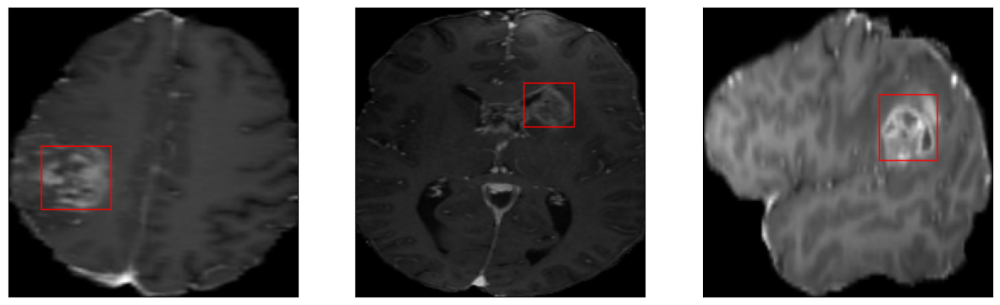

52/52 [==============================] - 135s 935ms/step - loss: 23.2787 - IoU: 0.1976 - val_loss: 4773.2598 - val_IoU: 0.0000e+00
Epoch 2/100
52/52 [==============================] - ETA: 0s - loss: 13.5880 - IoU: 0.3557
Epoch 2: val_IoU improved from 0.00000 to 0.07023, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 155ms/step


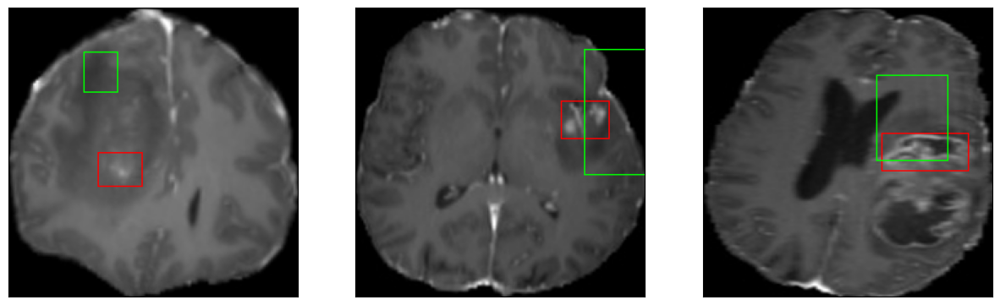

52/52 [==============================] - 34s 667ms/step - loss: 13.5880 - IoU: 0.3557 - val_loss: 54.6378 - val_IoU: 0.0702
Epoch 3/100
52/52 [==============================] - ETA: 0s - loss: 12.0526 - IoU: 0.4033
Epoch 3: val_IoU improved from 0.07023 to 0.14210, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 154ms/step


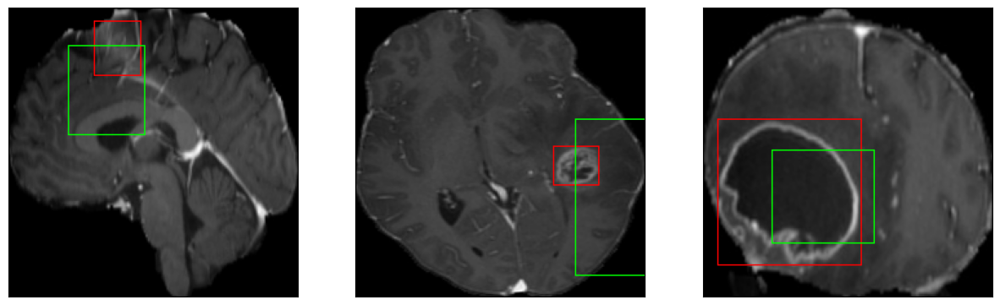

52/52 [==============================] - 34s 654ms/step - loss: 12.0526 - IoU: 0.4033 - val_loss: 32.9712 - val_IoU: 0.1421
Epoch 4/100
52/52 [==============================] - ETA: 0s - loss: 10.3132 - IoU: 0.4495
Epoch 4: val_IoU did not improve from 0.14210
8/8 [==============================] - 1s 159ms/step


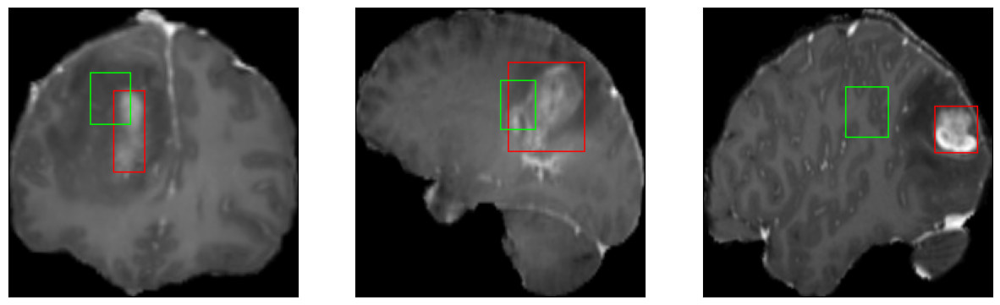

52/52 [==============================] - 22s 430ms/step - loss: 10.3132 - IoU: 0.4495 - val_loss: 19.4367 - val_IoU: 0.1286
Epoch 5/100
52/52 [==============================] - ETA: 0s - loss: 9.4247 - IoU: 0.4898
Epoch 5: val_IoU did not improve from 0.14210
8/8 [==============================] - 1s 158ms/step


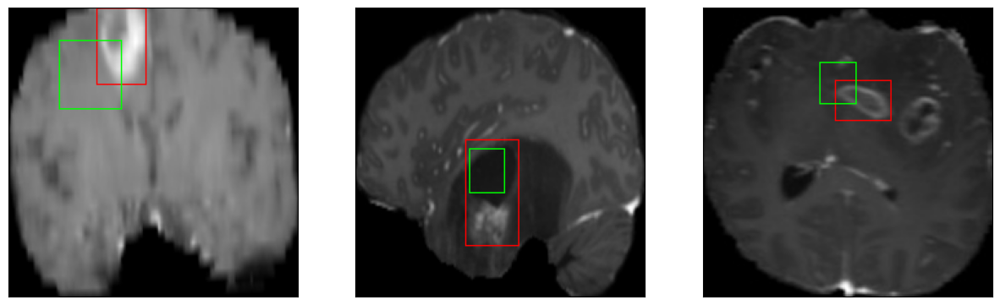

52/52 [==============================] - 22s 429ms/step - loss: 9.4247 - IoU: 0.4898 - val_loss: 26.5519 - val_IoU: 0.1102
Epoch 6/100
52/52 [==============================] - ETA: 0s - loss: 9.1347 - IoU: 0.4952
Epoch 6: val_IoU improved from 0.14210 to 0.39748, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 151ms/step


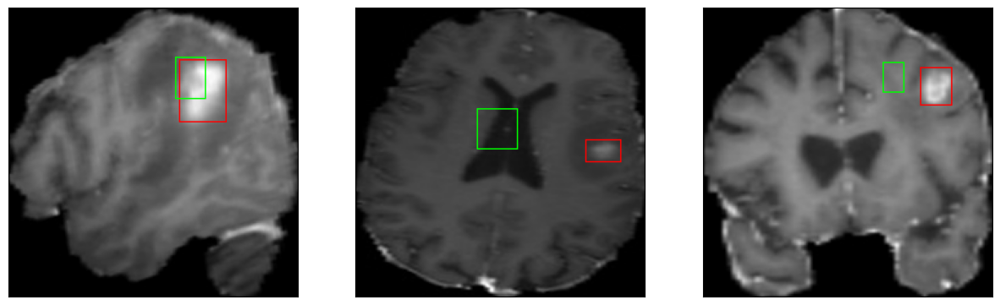

52/52 [==============================] - 34s 659ms/step - loss: 9.1347 - IoU: 0.4952 - val_loss: 11.0302 - val_IoU: 0.3975
Epoch 7/100
52/52 [==============================] - ETA: 0s - loss: 8.5574 - IoU: 0.5050
Epoch 7: val_IoU did not improve from 0.39748
8/8 [==============================] - 1s 160ms/step


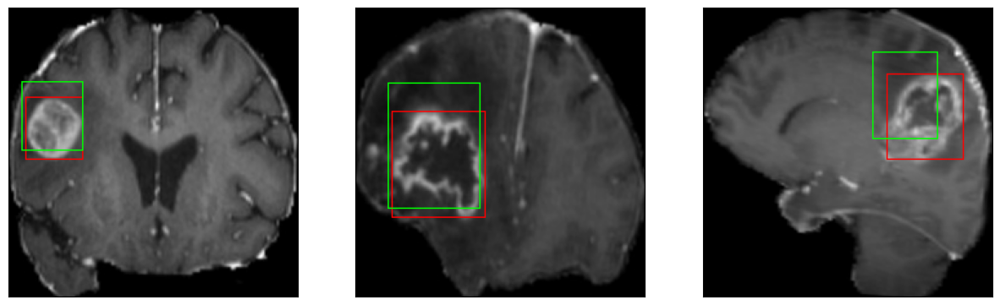

52/52 [==============================] - 22s 427ms/step - loss: 8.5574 - IoU: 0.5050 - val_loss: 11.7783 - val_IoU: 0.3718
Epoch 8/100
52/52 [==============================] - ETA: 0s - loss: 8.3233 - IoU: 0.5304
Epoch 8: val_IoU did not improve from 0.39748
8/8 [==============================] - 1s 157ms/step


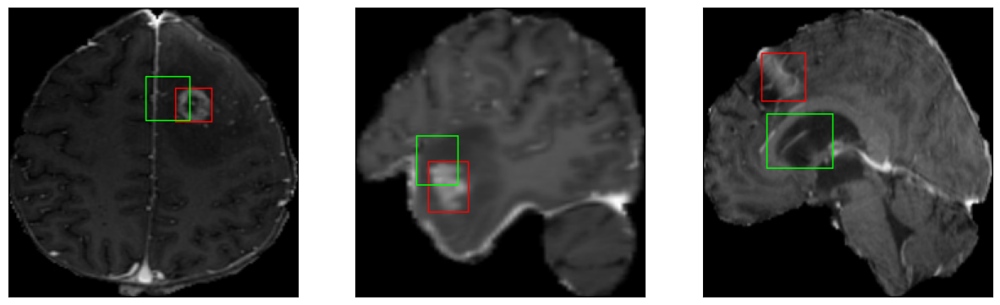

52/52 [==============================] - 22s 431ms/step - loss: 8.3233 - IoU: 0.5304 - val_loss: 13.0785 - val_IoU: 0.3028
Epoch 9/100
52/52 [==============================] - ETA: 0s - loss: 8.2434 - IoU: 0.5265
Epoch 9: val_IoU improved from 0.39748 to 0.42803, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 153ms/step


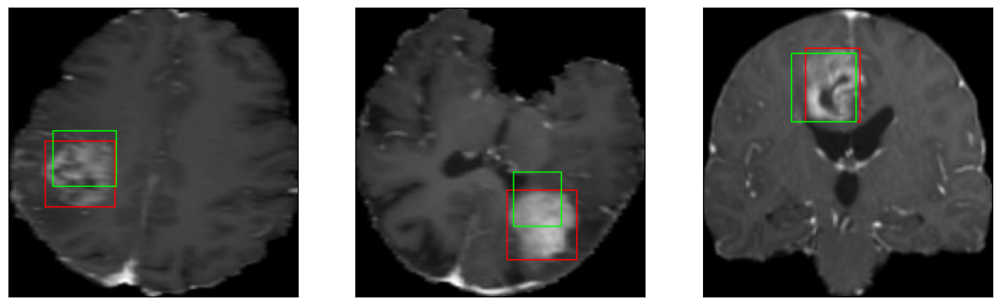

52/52 [==============================] - 33s 635ms/step - loss: 8.2434 - IoU: 0.5265 - val_loss: 11.3535 - val_IoU: 0.4280
Epoch 10/100
52/52 [==============================] - ETA: 0s - loss: 7.4775 - IoU: 0.5606
Epoch 10: val_IoU did not improve from 0.42803
8/8 [==============================] - 1s 159ms/step


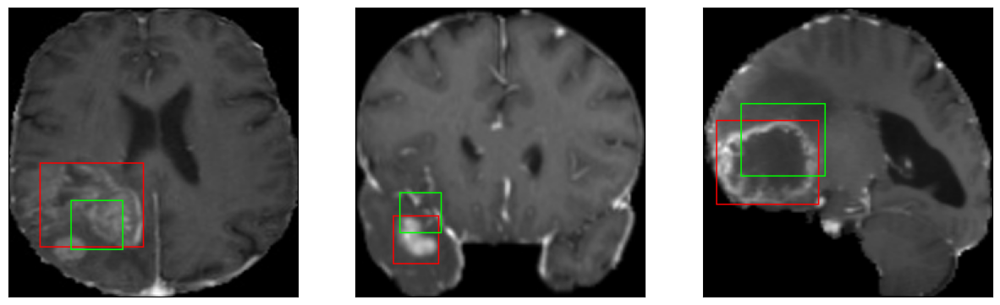

52/52 [==============================] - 22s 428ms/step - loss: 7.4775 - IoU: 0.5606 - val_loss: 12.1387 - val_IoU: 0.3560
Epoch 11/100
52/52 [==============================] - ETA: 0s - loss: 7.1904 - IoU: 0.5641
Epoch 11: val_IoU did not improve from 0.42803
8/8 [==============================] - 1s 160ms/step


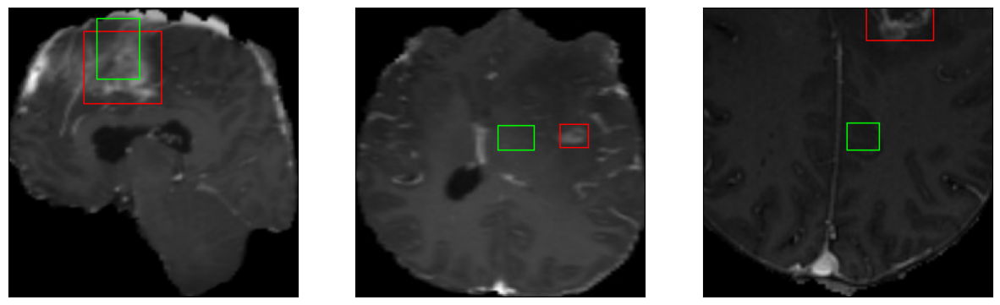

52/52 [==============================] - 23s 437ms/step - loss: 7.1904 - IoU: 0.5641 - val_loss: 10.2387 - val_IoU: 0.4112
Epoch 12/100
52/52 [==============================] - ETA: 0s - loss: 7.0065 - IoU: 0.5762
Epoch 12: val_IoU improved from 0.42803 to 0.52345, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 157ms/step


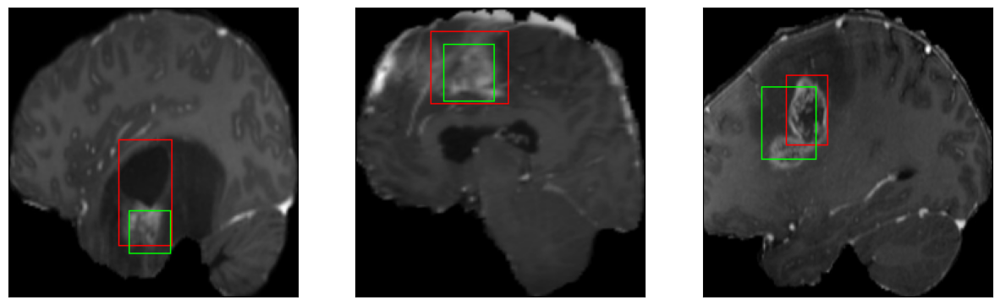

52/52 [==============================] - 38s 741ms/step - loss: 7.0065 - IoU: 0.5762 - val_loss: 8.2188 - val_IoU: 0.5234
Epoch 13/100
52/52 [==============================] - ETA: 0s - loss: 7.2705 - IoU: 0.5607
Epoch 13: val_IoU did not improve from 0.52345
8/8 [==============================] - 1s 161ms/step


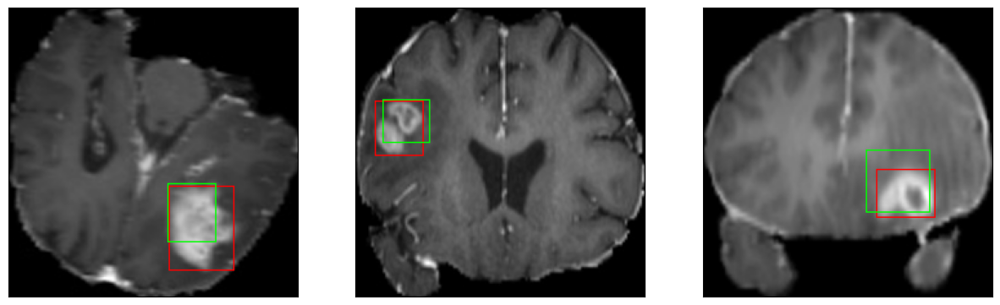

52/52 [==============================] - 23s 448ms/step - loss: 7.2705 - IoU: 0.5607 - val_loss: 9.8480 - val_IoU: 0.5149
Epoch 14/100
52/52 [==============================] - ETA: 0s - loss: 6.7197 - IoU: 0.5843
Epoch 14: val_IoU did not improve from 0.52345
8/8 [==============================] - 1s 154ms/step


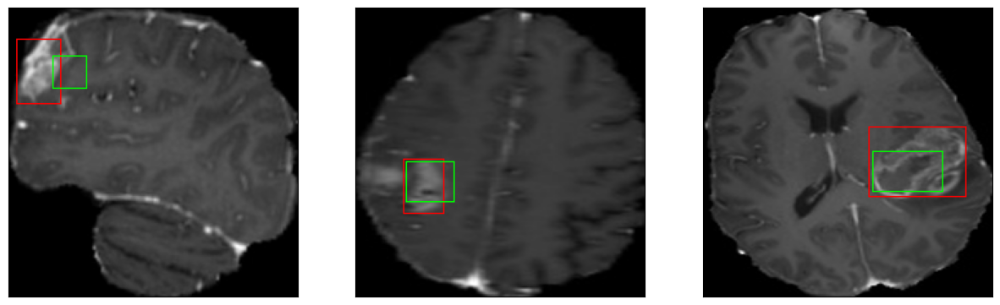

52/52 [==============================] - 22s 433ms/step - loss: 6.7197 - IoU: 0.5843 - val_loss: 9.4728 - val_IoU: 0.4726
Epoch 15/100
52/52 [==============================] - ETA: 0s - loss: 6.8293 - IoU: 0.5695
Epoch 15: val_IoU did not improve from 0.52345
8/8 [==============================] - 1s 152ms/step


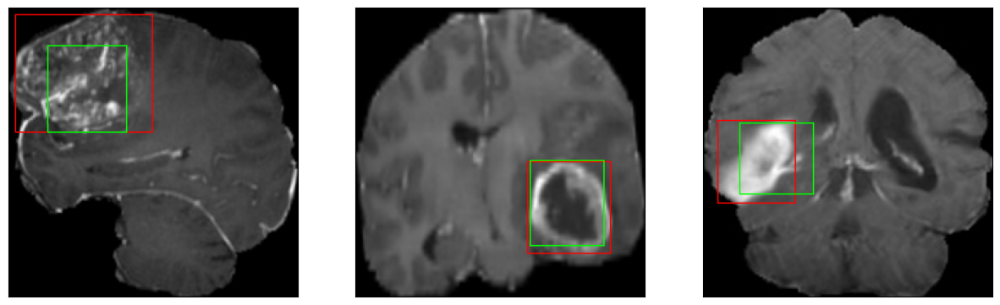

52/52 [==============================] - 22s 421ms/step - loss: 6.8293 - IoU: 0.5695 - val_loss: 8.6499 - val_IoU: 0.5034
Epoch 16/100
52/52 [==============================] - ETA: 0s - loss: 6.9960 - IoU: 0.5600
Epoch 16: val_IoU did not improve from 0.52345
8/8 [==============================] - 1s 161ms/step


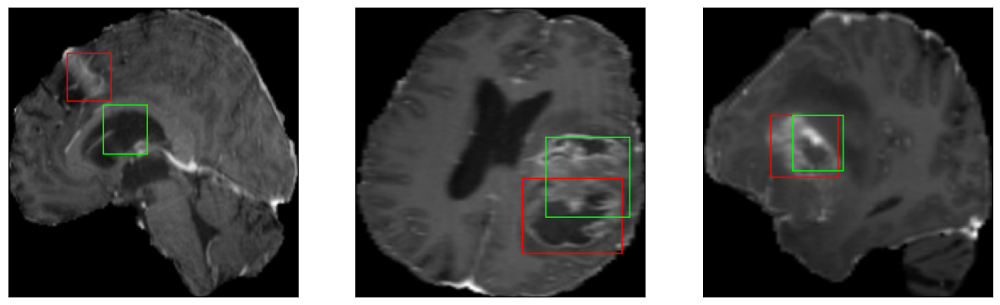

52/52 [==============================] - 22s 428ms/step - loss: 6.9960 - IoU: 0.5600 - val_loss: 8.8960 - val_IoU: 0.4679
Epoch 17/100
52/52 [==============================] - ETA: 0s - loss: 6.5707 - IoU: 0.5776
Epoch 17: val_IoU improved from 0.52345 to 0.55878, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 151ms/step


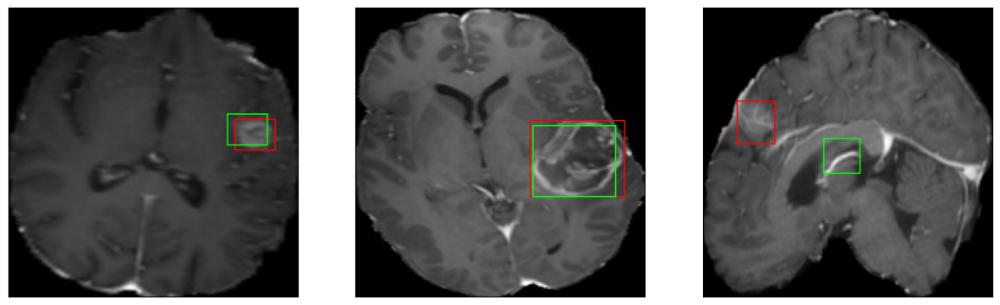

52/52 [==============================] - 34s 661ms/step - loss: 6.5707 - IoU: 0.5776 - val_loss: 7.8115 - val_IoU: 0.5588
Epoch 18/100
52/52 [==============================] - ETA: 0s - loss: 6.3183 - IoU: 0.6005
Epoch 18: val_IoU did not improve from 0.55878
8/8 [==============================] - 1s 157ms/step


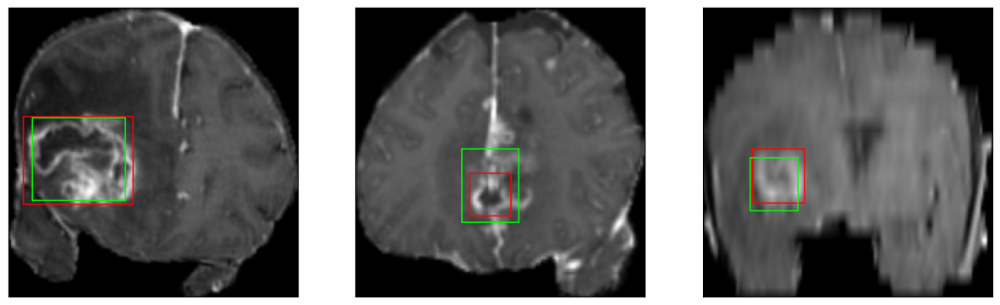

52/52 [==============================] - 22s 428ms/step - loss: 6.3183 - IoU: 0.6005 - val_loss: 8.9231 - val_IoU: 0.4900
Epoch 19/100
52/52 [==============================] - ETA: 0s - loss: 6.5264 - IoU: 0.5921
Epoch 19: val_IoU did not improve from 0.55878
8/8 [==============================] - 1s 158ms/step


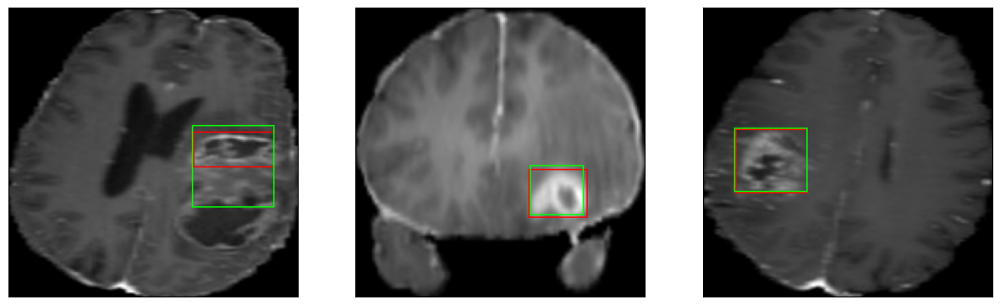

52/52 [==============================] - 23s 436ms/step - loss: 6.5264 - IoU: 0.5921 - val_loss: 7.4236 - val_IoU: 0.5539
Epoch 20/100
52/52 [==============================] - ETA: 0s - loss: 6.0824 - IoU: 0.6081
Epoch 20: val_IoU did not improve from 0.55878
8/8 [==============================] - 1s 157ms/step


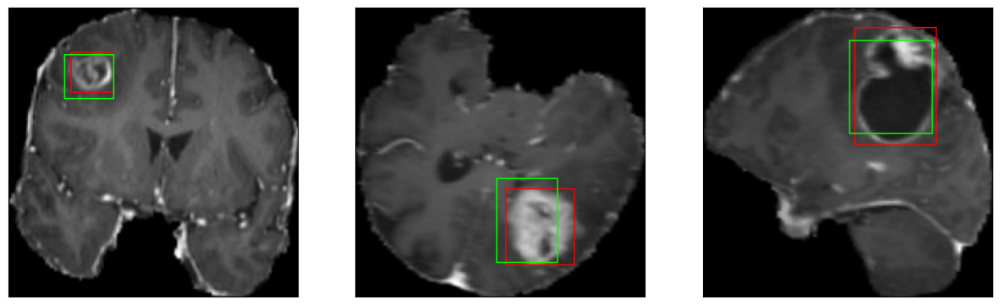

52/52 [==============================] - 22s 426ms/step - loss: 6.0824 - IoU: 0.6081 - val_loss: 7.6825 - val_IoU: 0.5497
Epoch 21/100
52/52 [==============================] - ETA: 0s - loss: 5.8740 - IoU: 0.6188
Epoch 21: val_IoU did not improve from 0.55878
8/8 [==============================] - 1s 163ms/step


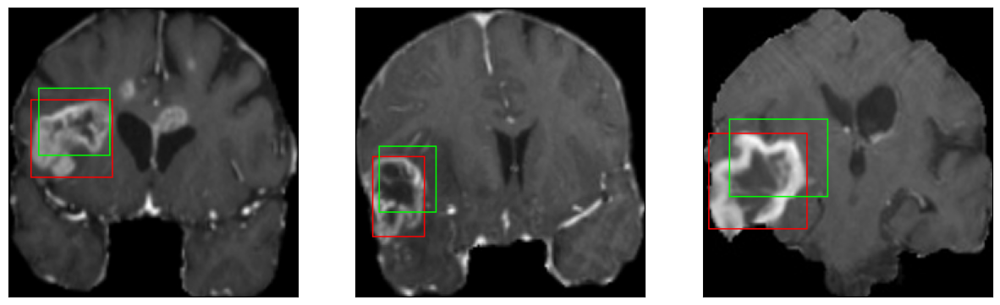

52/52 [==============================] - 23s 436ms/step - loss: 5.8740 - IoU: 0.6188 - val_loss: 8.9859 - val_IoU: 0.4766
Epoch 22/100
52/52 [==============================] - ETA: 0s - loss: 6.1481 - IoU: 0.6025
Epoch 22: val_IoU improved from 0.55878 to 0.58032, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 158ms/step


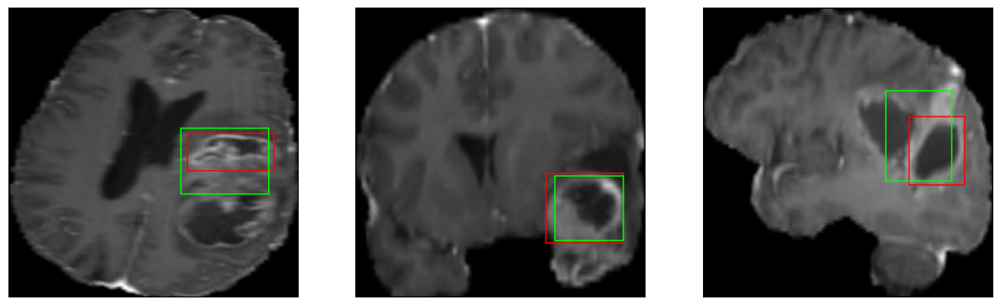

52/52 [==============================] - 35s 670ms/step - loss: 6.1481 - IoU: 0.6025 - val_loss: 7.0204 - val_IoU: 0.5803
Epoch 23/100
52/52 [==============================] - ETA: 0s - loss: 5.9776 - IoU: 0.6174
Epoch 23: val_IoU did not improve from 0.58032
8/8 [==============================] - 1s 162ms/step


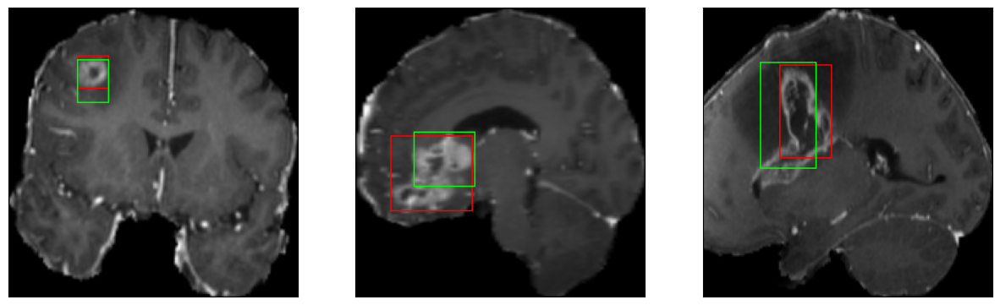

52/52 [==============================] - 23s 437ms/step - loss: 5.9776 - IoU: 0.6174 - val_loss: 8.1319 - val_IoU: 0.5663
Epoch 24/100
52/52 [==============================] - ETA: 0s - loss: 6.1599 - IoU: 0.5996
Epoch 24: val_IoU improved from 0.58032 to 0.59267, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 157ms/step


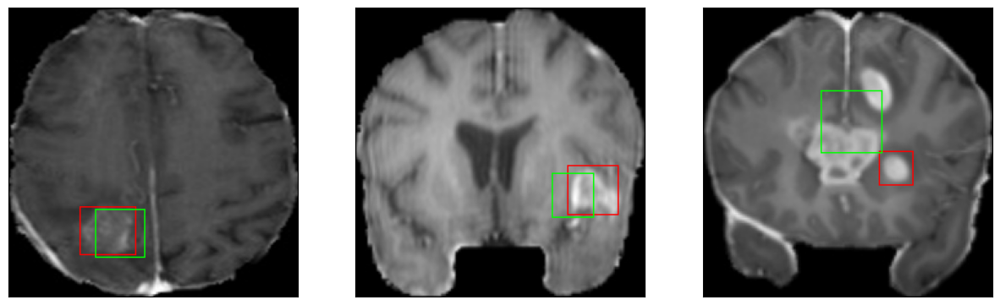

52/52 [==============================] - 34s 661ms/step - loss: 6.1599 - IoU: 0.5996 - val_loss: 6.9559 - val_IoU: 0.5927
Epoch 25/100
52/52 [==============================] - ETA: 0s - loss: 5.4762 - IoU: 0.6458
Epoch 25: val_IoU did not improve from 0.59267
8/8 [==============================] - 1s 155ms/step


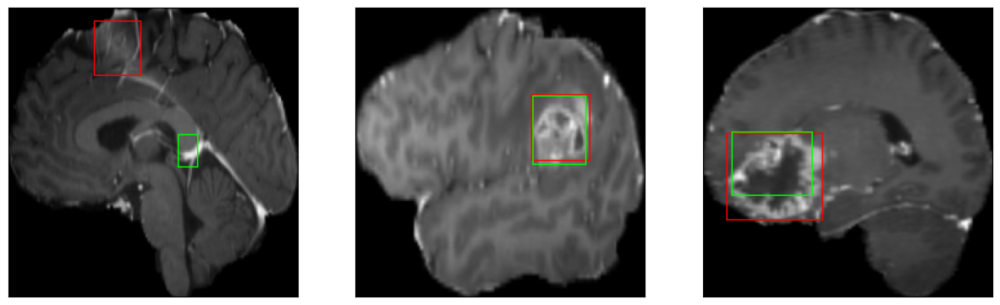

52/52 [==============================] - 22s 434ms/step - loss: 5.4762 - IoU: 0.6458 - val_loss: 8.1044 - val_IoU: 0.5282
Epoch 26/100
52/52 [==============================] - ETA: 0s - loss: 5.9047 - IoU: 0.6126
Epoch 26: val_IoU did not improve from 0.59267
8/8 [==============================] - 1s 154ms/step


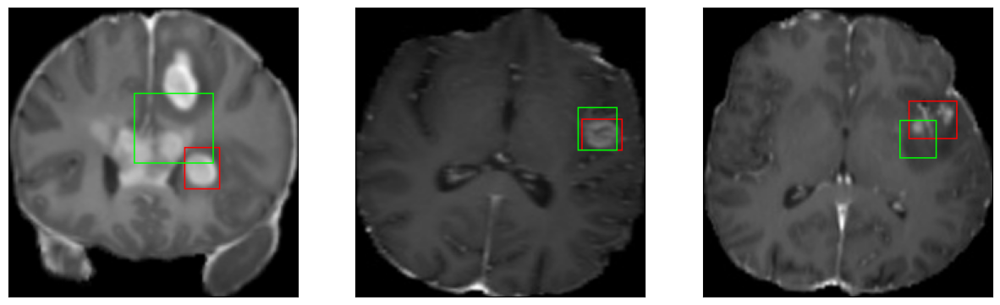

52/52 [==============================] - 22s 421ms/step - loss: 5.9047 - IoU: 0.6126 - val_loss: 8.4521 - val_IoU: 0.5157
Epoch 27/100
52/52 [==============================] - ETA: 0s - loss: 6.0257 - IoU: 0.6107
Epoch 27: val_IoU did not improve from 0.59267
8/8 [==============================] - 1s 164ms/step


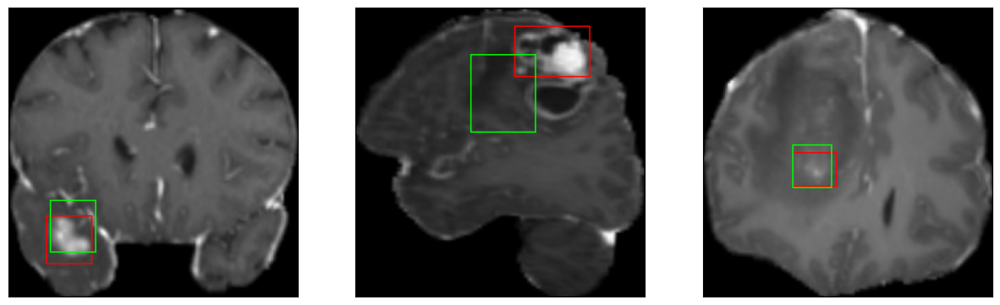

52/52 [==============================] - 23s 437ms/step - loss: 6.0257 - IoU: 0.6107 - val_loss: 8.1420 - val_IoU: 0.5292
Epoch 28/100
52/52 [==============================] - ETA: 0s - loss: 5.8022 - IoU: 0.6265
Epoch 28: val_IoU did not improve from 0.59267
8/8 [==============================] - 1s 154ms/step


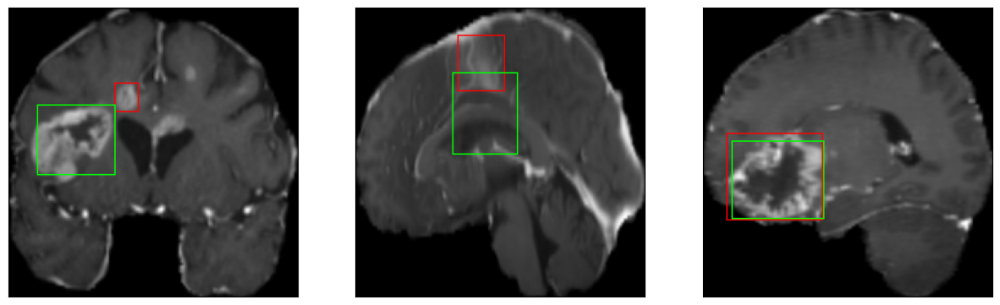

52/52 [==============================] - 22s 432ms/step - loss: 5.8022 - IoU: 0.6265 - val_loss: 6.9838 - val_IoU: 0.5873
Epoch 29/100
52/52 [==============================] - ETA: 0s - loss: 5.4032 - IoU: 0.6489
Epoch 29: val_IoU did not improve from 0.59267
8/8 [==============================] - 1s 152ms/step


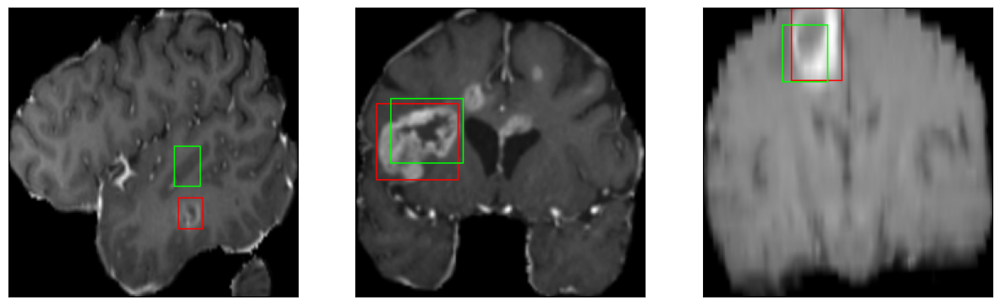

52/52 [==============================] - 22s 428ms/step - loss: 5.4032 - IoU: 0.6489 - val_loss: 7.2878 - val_IoU: 0.5728
Epoch 30/100
52/52 [==============================] - ETA: 0s - loss: 5.5644 - IoU: 0.6349
Epoch 30: val_IoU improved from 0.59267 to 0.61053, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 158ms/step


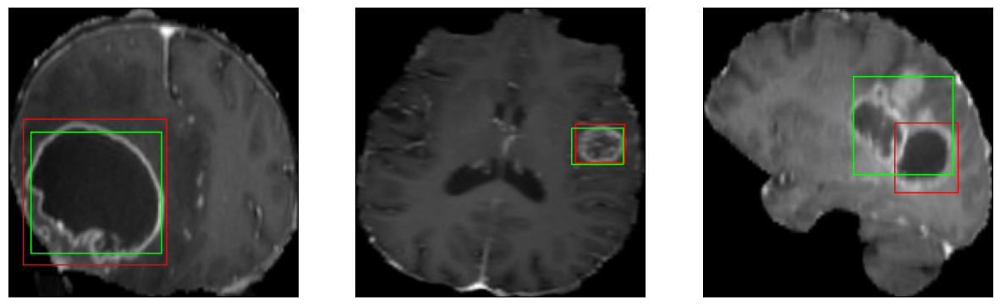

52/52 [==============================] - 38s 736ms/step - loss: 5.5644 - IoU: 0.6349 - val_loss: 7.1907 - val_IoU: 0.6105
Epoch 31/100
52/52 [==============================] - ETA: 0s - loss: 5.3353 - IoU: 0.6444
Epoch 31: val_IoU did not improve from 0.61053
8/8 [==============================] - 1s 161ms/step


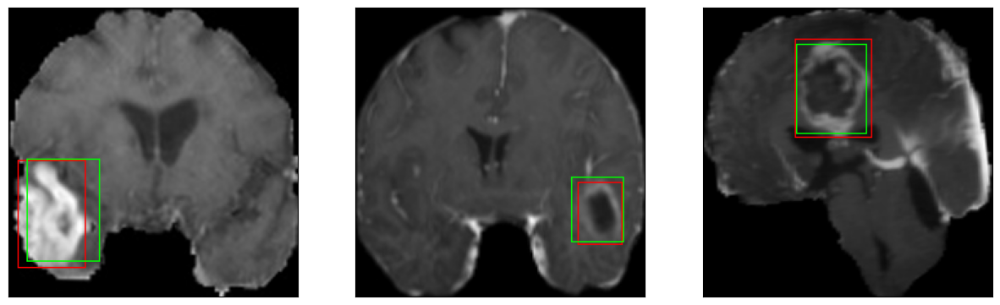

52/52 [==============================] - 23s 440ms/step - loss: 5.3353 - IoU: 0.6444 - val_loss: 7.1308 - val_IoU: 0.5859
Epoch 32/100
52/52 [==============================] - ETA: 0s - loss: 5.2490 - IoU: 0.6414
Epoch 32: val_IoU did not improve from 0.61053
8/8 [==============================] - 1s 157ms/step


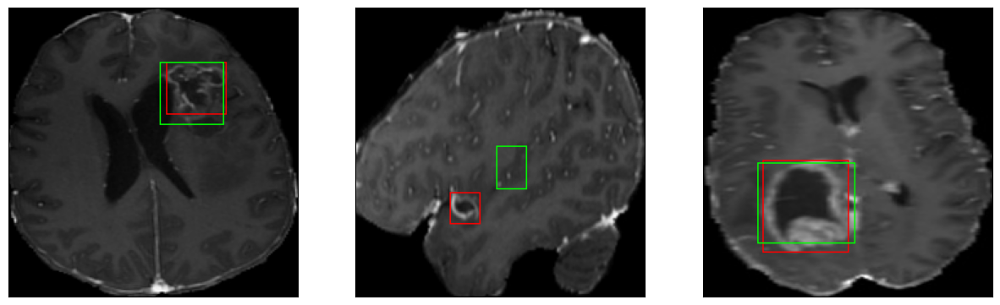

52/52 [==============================] - 22s 426ms/step - loss: 5.2490 - IoU: 0.6414 - val_loss: 6.7853 - val_IoU: 0.6036
Epoch 33/100
52/52 [==============================] - ETA: 0s - loss: 5.3202 - IoU: 0.6409
Epoch 33: val_IoU improved from 0.61053 to 0.61056, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 154ms/step


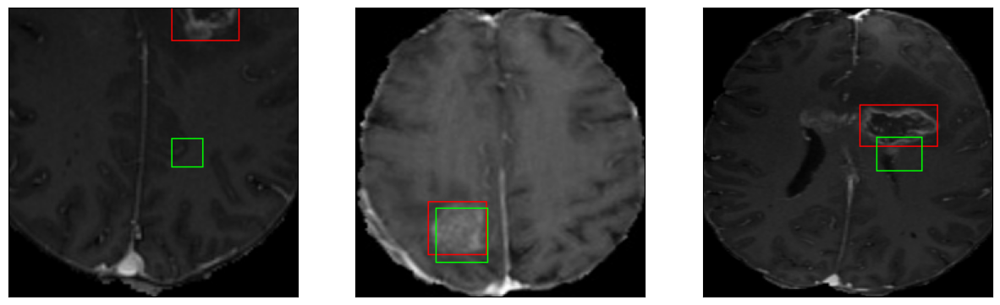

52/52 [==============================] - 44s 848ms/step - loss: 5.3202 - IoU: 0.6409 - val_loss: 6.9727 - val_IoU: 0.6106
Epoch 34/100
52/52 [==============================] - ETA: 0s - loss: 5.4980 - IoU: 0.6347
Epoch 34: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 160ms/step


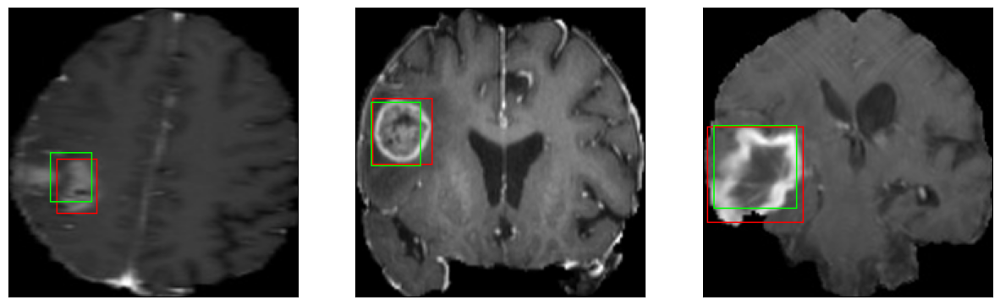

52/52 [==============================] - 22s 430ms/step - loss: 5.4980 - IoU: 0.6347 - val_loss: 7.9688 - val_IoU: 0.5332
Epoch 35/100
52/52 [==============================] - ETA: 0s - loss: 5.3722 - IoU: 0.6354
Epoch 35: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 161ms/step


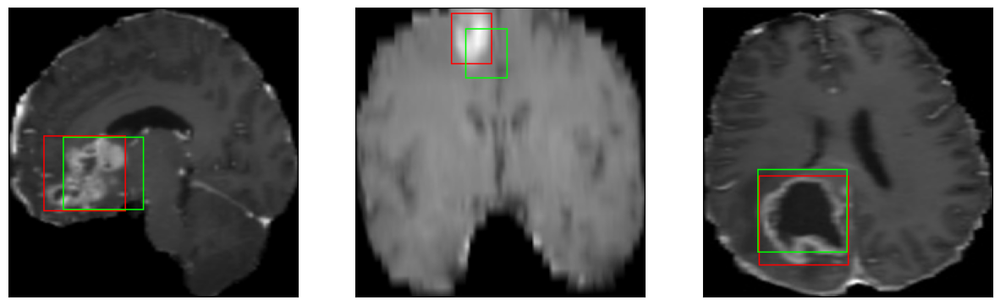

52/52 [==============================] - 22s 430ms/step - loss: 5.3722 - IoU: 0.6354 - val_loss: 8.8072 - val_IoU: 0.5356
Epoch 36/100
52/52 [==============================] - ETA: 0s - loss: 5.2557 - IoU: 0.6497
Epoch 36: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 160ms/step


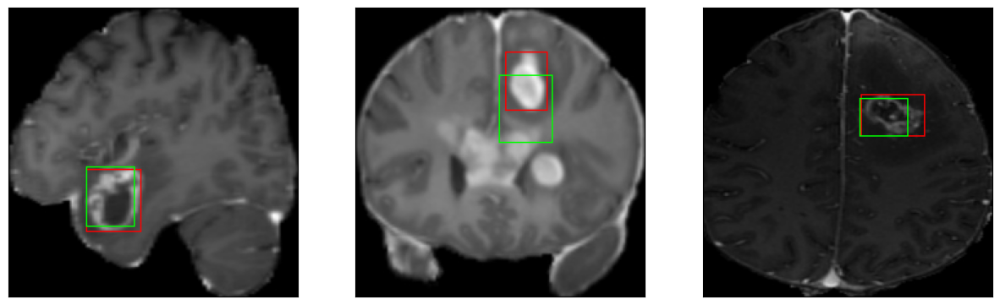

52/52 [==============================] - 22s 432ms/step - loss: 5.2557 - IoU: 0.6497 - val_loss: 8.3787 - val_IoU: 0.5399
Epoch 37/100
52/52 [==============================] - ETA: 0s - loss: 5.4350 - IoU: 0.6306
Epoch 37: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 156ms/step


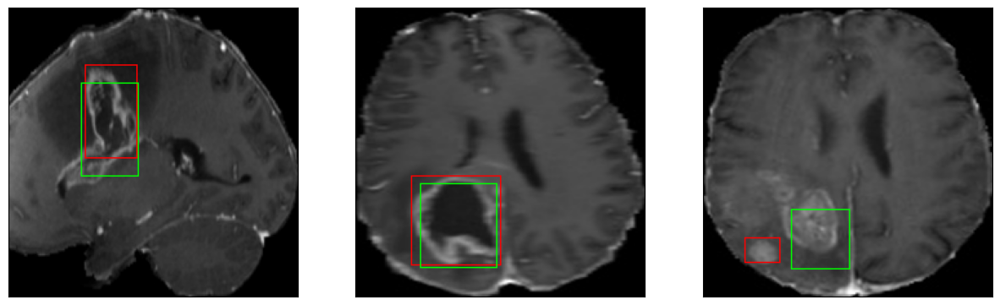

52/52 [==============================] - 23s 435ms/step - loss: 5.4350 - IoU: 0.6306 - val_loss: 8.3942 - val_IoU: 0.4635
Epoch 38/100
52/52 [==============================] - ETA: 0s - loss: 5.5635 - IoU: 0.6304
Epoch 38: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 158ms/step


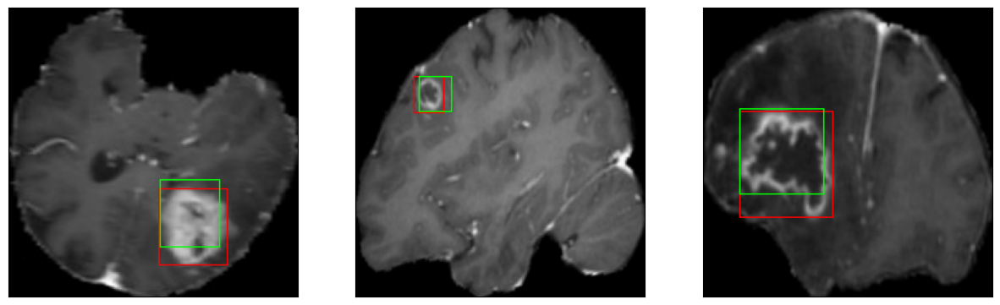

52/52 [==============================] - 22s 426ms/step - loss: 5.5635 - IoU: 0.6304 - val_loss: 8.7281 - val_IoU: 0.5299
Epoch 39/100
52/52 [==============================] - ETA: 0s - loss: 5.1717 - IoU: 0.6449
Epoch 39: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 163ms/step


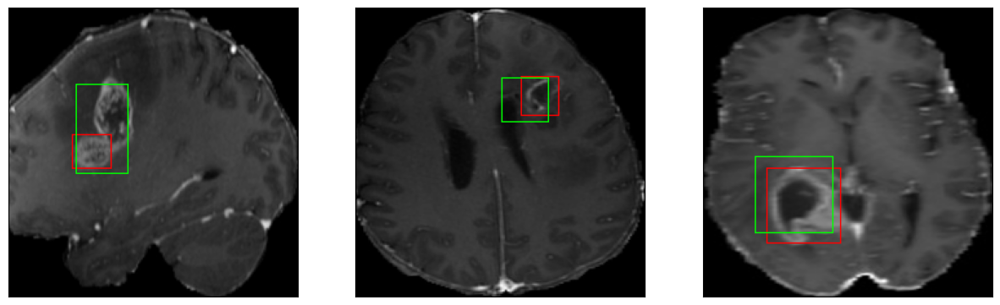

52/52 [==============================] - 23s 439ms/step - loss: 5.1717 - IoU: 0.6449 - val_loss: 7.0280 - val_IoU: 0.5773
Epoch 40/100
52/52 [==============================] - ETA: 0s - loss: 5.0556 - IoU: 0.6494
Epoch 40: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 160ms/step


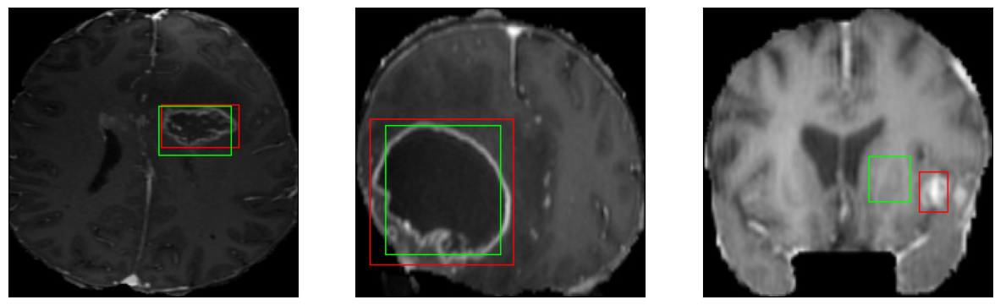

52/52 [==============================] - 23s 435ms/step - loss: 5.0556 - IoU: 0.6494 - val_loss: 7.2869 - val_IoU: 0.5982
Epoch 41/100
52/52 [==============================] - ETA: 0s - loss: 5.0721 - IoU: 0.6573
Epoch 41: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 164ms/step


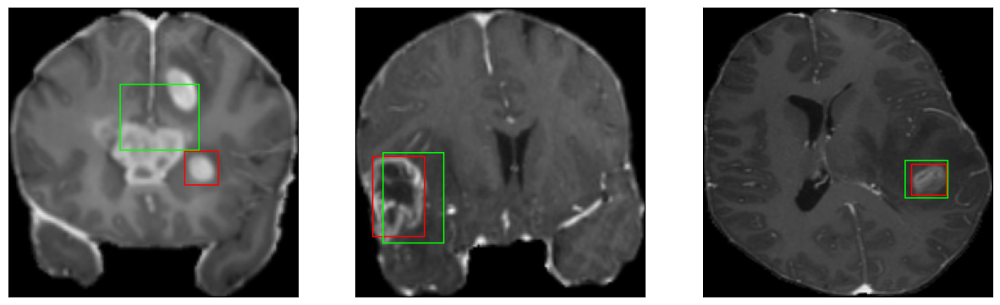

52/52 [==============================] - 23s 438ms/step - loss: 5.0721 - IoU: 0.6573 - val_loss: 7.1734 - val_IoU: 0.5907
Epoch 42/100
52/52 [==============================] - ETA: 0s - loss: 4.9693 - IoU: 0.6589
Epoch 42: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 155ms/step


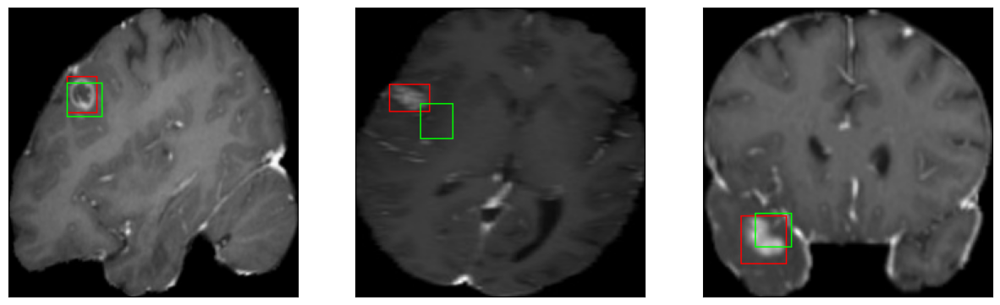

52/52 [==============================] - 22s 432ms/step - loss: 4.9693 - IoU: 0.6589 - val_loss: 7.6234 - val_IoU: 0.5845
Epoch 43/100
52/52 [==============================] - ETA: 0s - loss: 5.1389 - IoU: 0.6491
Epoch 43: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 157ms/step


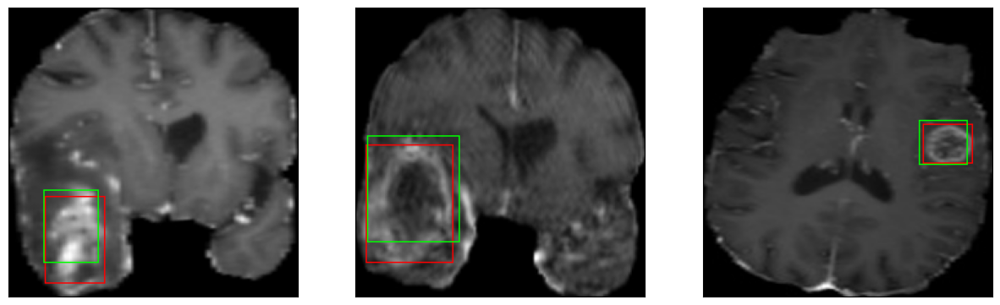

52/52 [==============================] - 22s 427ms/step - loss: 5.1389 - IoU: 0.6491 - val_loss: 8.3920 - val_IoU: 0.5276
Epoch 44/100
52/52 [==============================] - ETA: 0s - loss: 5.3112 - IoU: 0.6344
Epoch 44: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 161ms/step


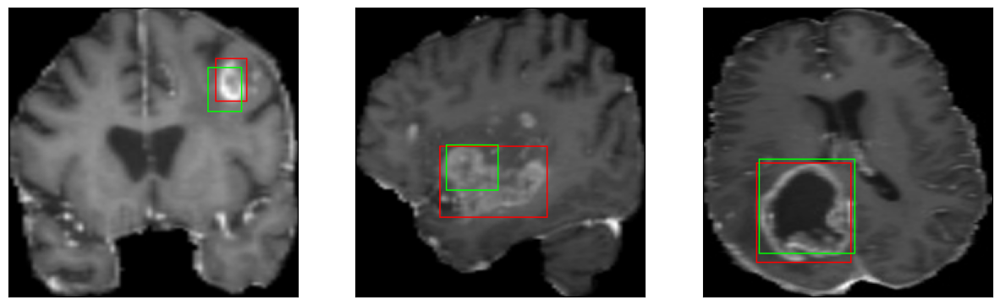

52/52 [==============================] - 23s 443ms/step - loss: 5.3112 - IoU: 0.6344 - val_loss: 7.7019 - val_IoU: 0.5766
Epoch 45/100
52/52 [==============================] - ETA: 0s - loss: 4.9222 - IoU: 0.6639
Epoch 45: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 158ms/step


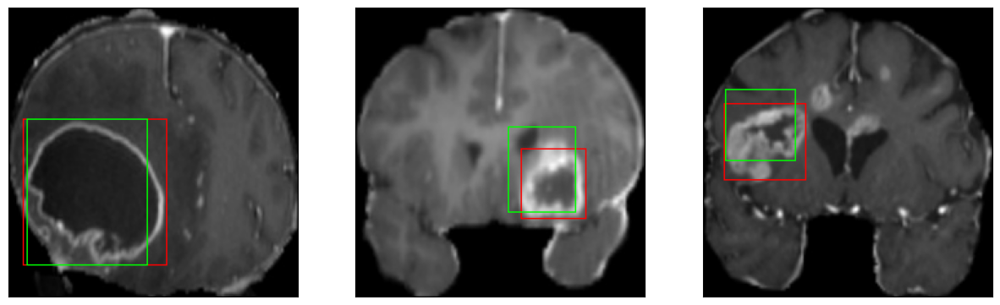

52/52 [==============================] - 22s 426ms/step - loss: 4.9222 - IoU: 0.6639 - val_loss: 9.2609 - val_IoU: 0.4972
Epoch 46/100
52/52 [==============================] - ETA: 0s - loss: 5.0003 - IoU: 0.6618
Epoch 46: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 166ms/step


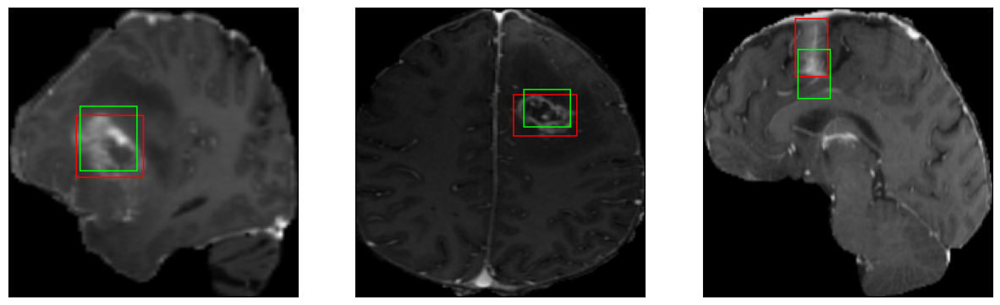

52/52 [==============================] - 23s 437ms/step - loss: 5.0003 - IoU: 0.6618 - val_loss: 7.4554 - val_IoU: 0.5497
Epoch 47/100
52/52 [==============================] - ETA: 0s - loss: 4.7335 - IoU: 0.6692
Epoch 47: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 153ms/step


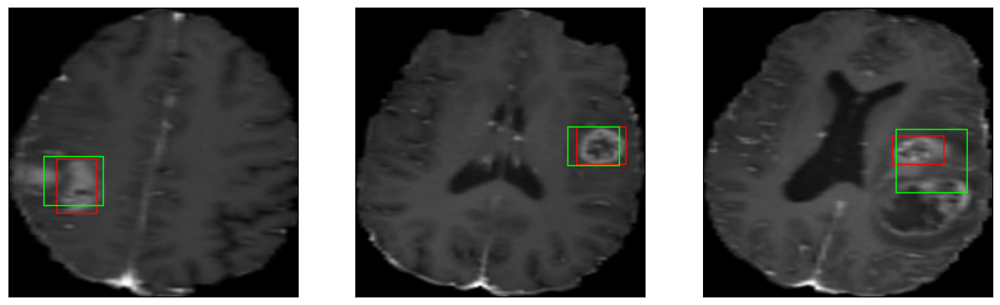

52/52 [==============================] - 23s 437ms/step - loss: 4.7335 - IoU: 0.6692 - val_loss: 7.5966 - val_IoU: 0.5900
Epoch 48/100
52/52 [==============================] - ETA: 0s - loss: 5.0108 - IoU: 0.6621
Epoch 48: val_IoU did not improve from 0.61056
8/8 [==============================] - 1s 156ms/step


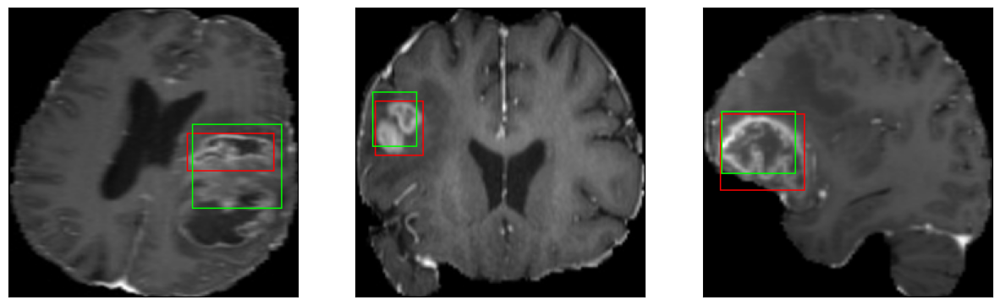

52/52 [==============================] - 22s 426ms/step - loss: 5.0108 - IoU: 0.6621 - val_loss: 7.4572 - val_IoU: 0.5618
Epoch 49/100
52/52 [==============================] - ETA: 0s - loss: 4.9784 - IoU: 0.6594
Epoch 49: val_IoU improved from 0.61056 to 0.62179, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 154ms/step


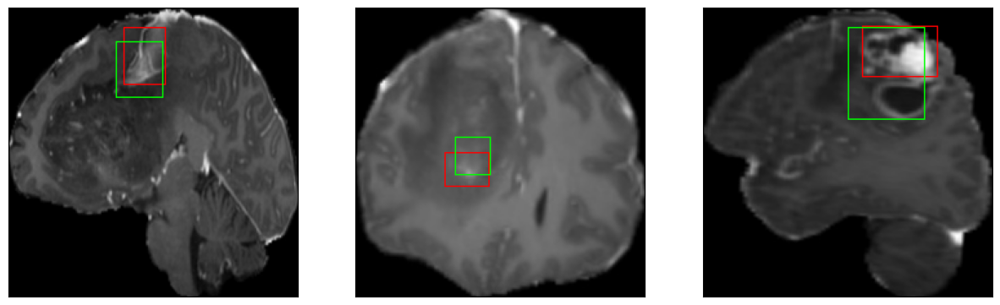

52/52 [==============================] - 39s 757ms/step - loss: 4.9784 - IoU: 0.6594 - val_loss: 6.8010 - val_IoU: 0.6218
Epoch 50/100
52/52 [==============================] - ETA: 0s - loss: 4.9122 - IoU: 0.6583
Epoch 50: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 162ms/step


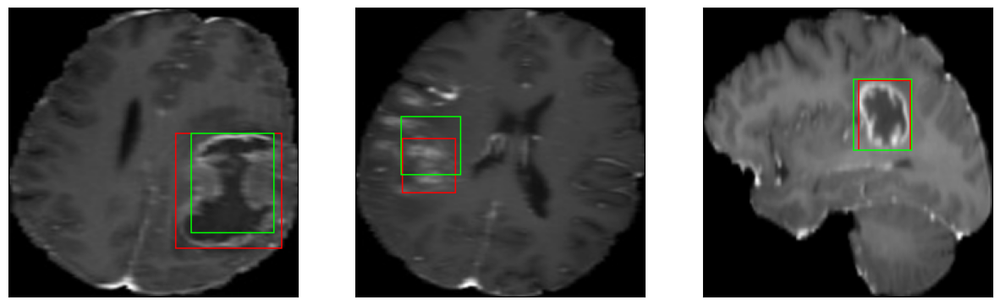

52/52 [==============================] - 23s 438ms/step - loss: 4.9122 - IoU: 0.6583 - val_loss: 7.0084 - val_IoU: 0.5925
Epoch 51/100
52/52 [==============================] - ETA: 0s - loss: 5.0777 - IoU: 0.6511
Epoch 51: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 164ms/step


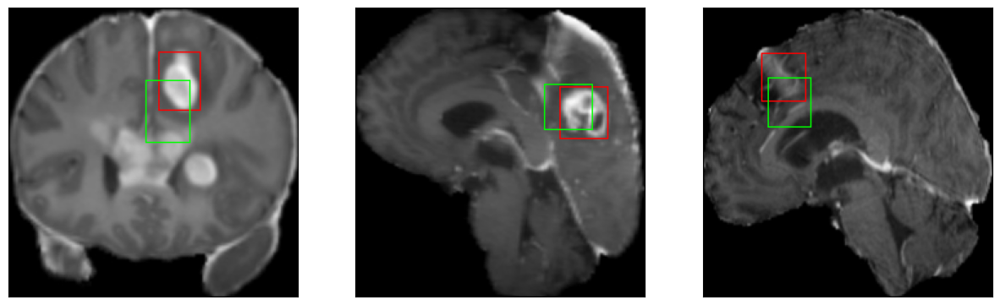

52/52 [==============================] - 23s 433ms/step - loss: 5.0777 - IoU: 0.6511 - val_loss: 6.8187 - val_IoU: 0.6019
Epoch 52/100
52/52 [==============================] - ETA: 0s - loss: 5.0409 - IoU: 0.6569
Epoch 52: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 164ms/step


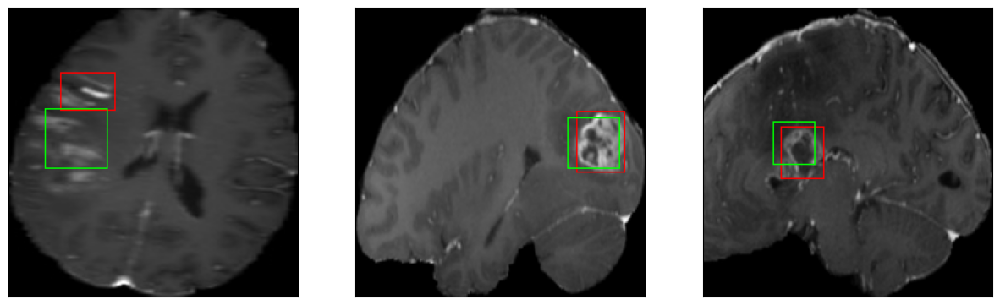

52/52 [==============================] - 23s 434ms/step - loss: 5.0409 - IoU: 0.6569 - val_loss: 8.2397 - val_IoU: 0.5388
Epoch 53/100
52/52 [==============================] - ETA: 0s - loss: 5.2254 - IoU: 0.6560
Epoch 53: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 157ms/step


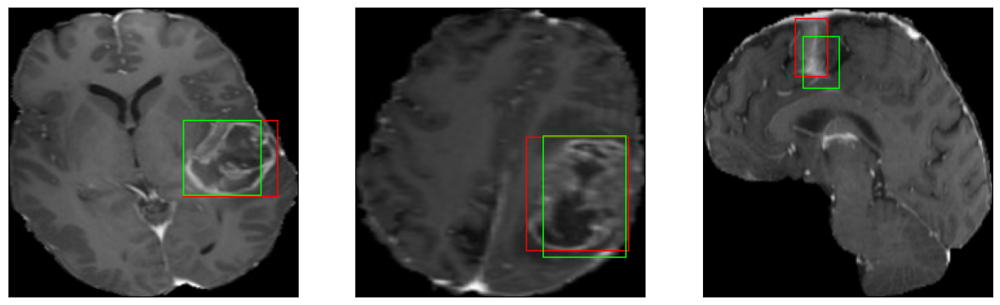

52/52 [==============================] - 23s 435ms/step - loss: 5.2254 - IoU: 0.6560 - val_loss: 8.1797 - val_IoU: 0.5428
Epoch 54/100
52/52 [==============================] - ETA: 0s - loss: 5.3365 - IoU: 0.6440
Epoch 54: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 155ms/step


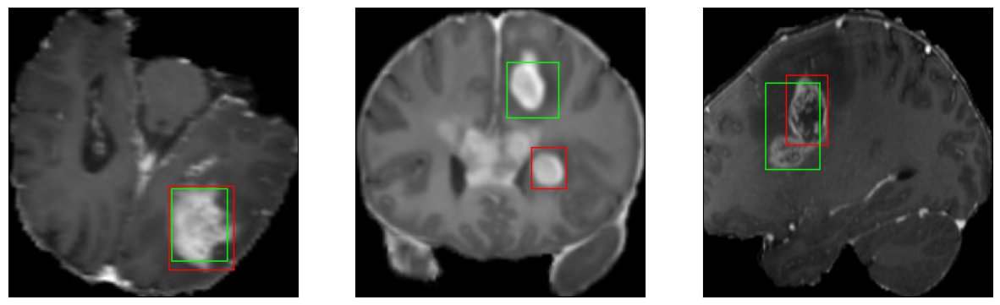

52/52 [==============================] - 22s 428ms/step - loss: 5.3365 - IoU: 0.6440 - val_loss: 11.1444 - val_IoU: 0.4975
Epoch 55/100
52/52 [==============================] - ETA: 0s - loss: 5.7381 - IoU: 0.6379
Epoch 55: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 163ms/step


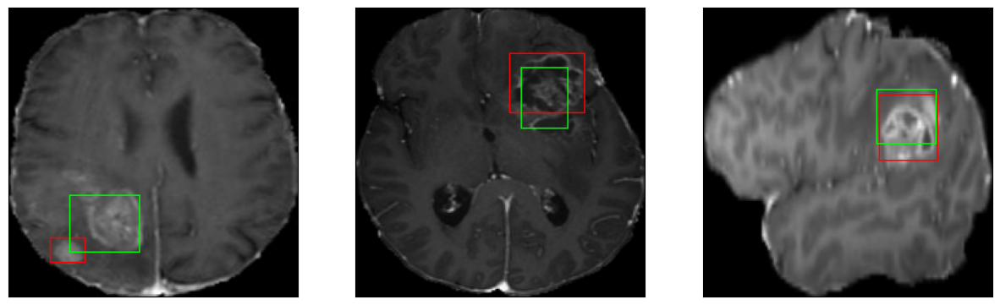

52/52 [==============================] - 23s 441ms/step - loss: 5.7381 - IoU: 0.6379 - val_loss: 20.8151 - val_IoU: 0.3627
Epoch 56/100
52/52 [==============================] - ETA: 0s - loss: 6.0067 - IoU: 0.6132
Epoch 56: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 159ms/step


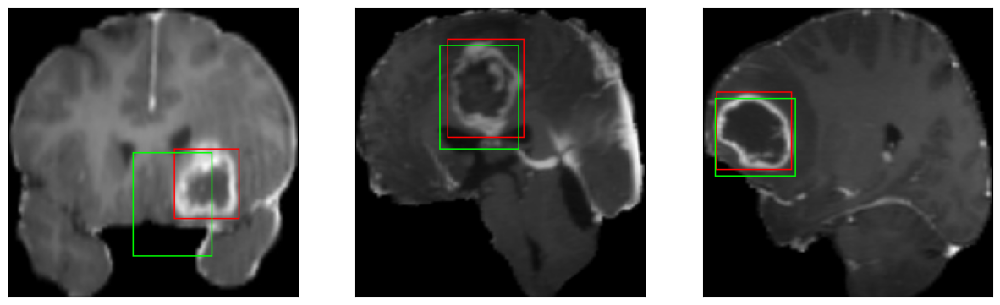

52/52 [==============================] - 22s 431ms/step - loss: 6.0067 - IoU: 0.6132 - val_loss: 12.1487 - val_IoU: 0.5036
Epoch 57/100
52/52 [==============================] - ETA: 0s - loss: 5.3928 - IoU: 0.6453
Epoch 57: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 160ms/step


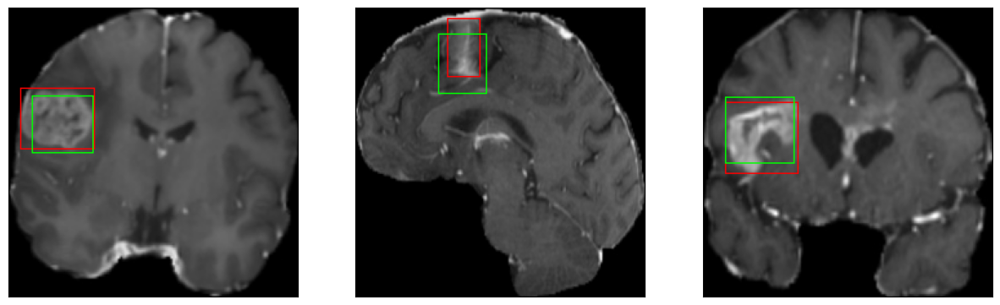

52/52 [==============================] - 23s 437ms/step - loss: 5.3928 - IoU: 0.6453 - val_loss: 7.2119 - val_IoU: 0.5898
Epoch 58/100
52/52 [==============================] - ETA: 0s - loss: 4.9271 - IoU: 0.6595
Epoch 58: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 155ms/step


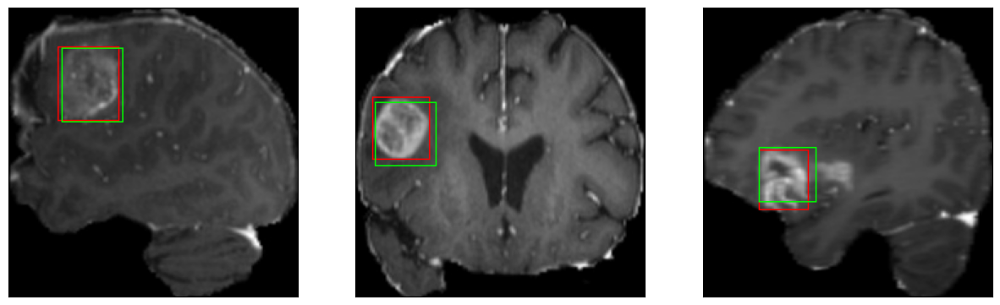

52/52 [==============================] - 23s 436ms/step - loss: 4.9271 - IoU: 0.6595 - val_loss: 7.9647 - val_IoU: 0.5736
Epoch 59/100
52/52 [==============================] - ETA: 0s - loss: 4.9732 - IoU: 0.6597
Epoch 59: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 155ms/step


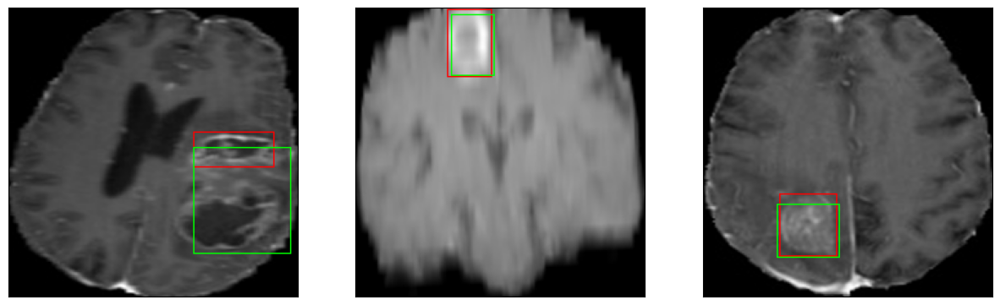

52/52 [==============================] - 22s 427ms/step - loss: 4.9732 - IoU: 0.6597 - val_loss: 6.8625 - val_IoU: 0.6207
Epoch 60/100
52/52 [==============================] - ETA: 0s - loss: 4.9194 - IoU: 0.6667
Epoch 60: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 161ms/step


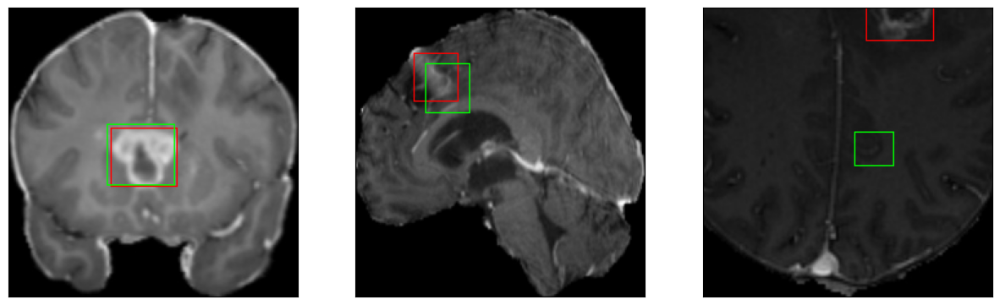

52/52 [==============================] - 23s 438ms/step - loss: 4.9194 - IoU: 0.6667 - val_loss: 6.9689 - val_IoU: 0.6156
Epoch 61/100
52/52 [==============================] - ETA: 0s - loss: 4.7846 - IoU: 0.6734
Epoch 61: val_IoU did not improve from 0.62179
8/8 [==============================] - 1s 164ms/step


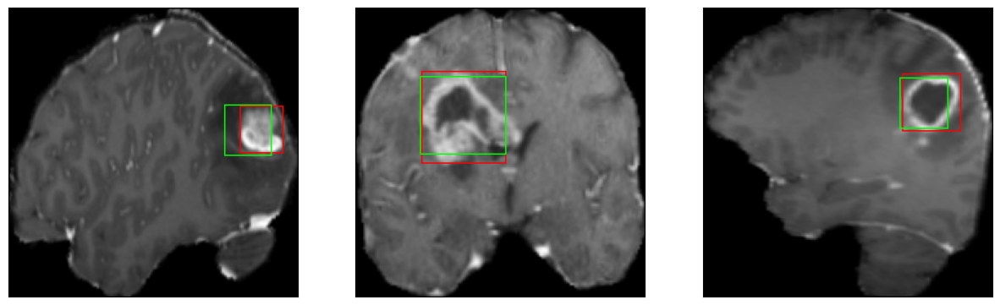

52/52 [==============================] - 23s 438ms/step - loss: 4.7846 - IoU: 0.6734 - val_loss: 7.3104 - val_IoU: 0.5807
Epoch 62/100
52/52 [==============================] - ETA: 0s - loss: 4.5745 - IoU: 0.6857
Epoch 62: val_IoU improved from 0.62179 to 0.63808, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 156ms/step


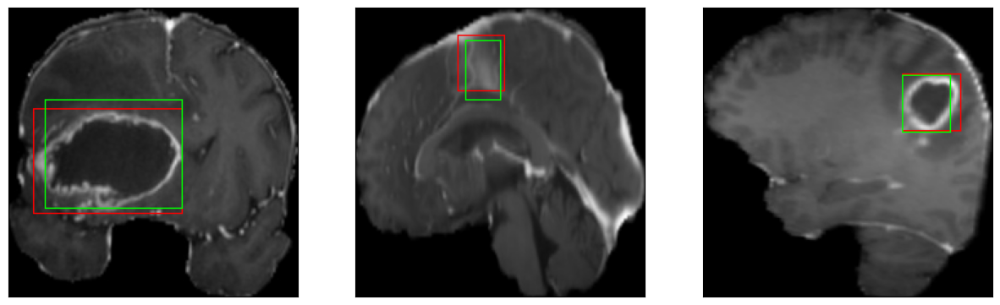

52/52 [==============================] - 39s 757ms/step - loss: 4.5745 - IoU: 0.6857 - val_loss: 6.7609 - val_IoU: 0.6381
Epoch 63/100
52/52 [==============================] - ETA: 0s - loss: 4.7527 - IoU: 0.6757
Epoch 63: val_IoU did not improve from 0.63808
8/8 [==============================] - 1s 159ms/step


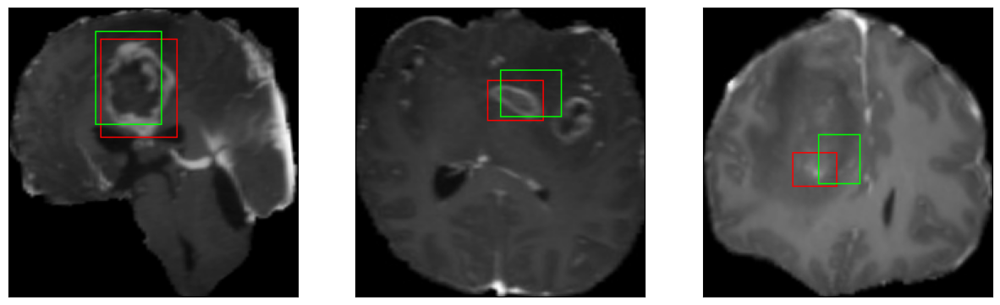

52/52 [==============================] - 23s 434ms/step - loss: 4.7527 - IoU: 0.6757 - val_loss: 7.4265 - val_IoU: 0.5739
Epoch 64/100
52/52 [==============================] - ETA: 0s - loss: 4.7677 - IoU: 0.6694
Epoch 64: val_IoU did not improve from 0.63808
8/8 [==============================] - 1s 167ms/step


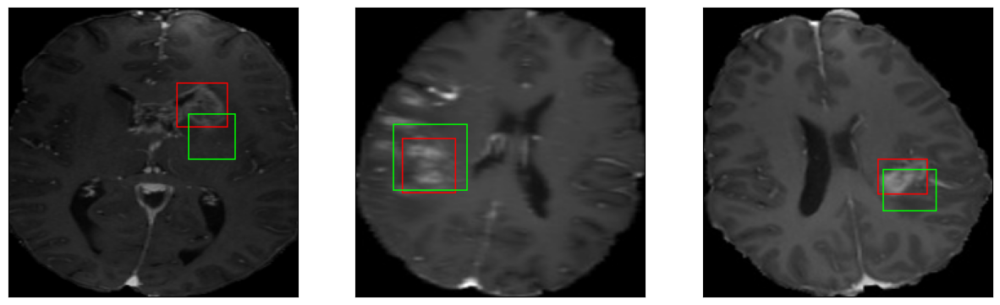

52/52 [==============================] - 23s 439ms/step - loss: 4.7677 - IoU: 0.6694 - val_loss: 6.7610 - val_IoU: 0.6273
Epoch 65/100
52/52 [==============================] - ETA: 0s - loss: 4.8338 - IoU: 0.6646
Epoch 65: val_IoU did not improve from 0.63808
8/8 [==============================] - 1s 155ms/step


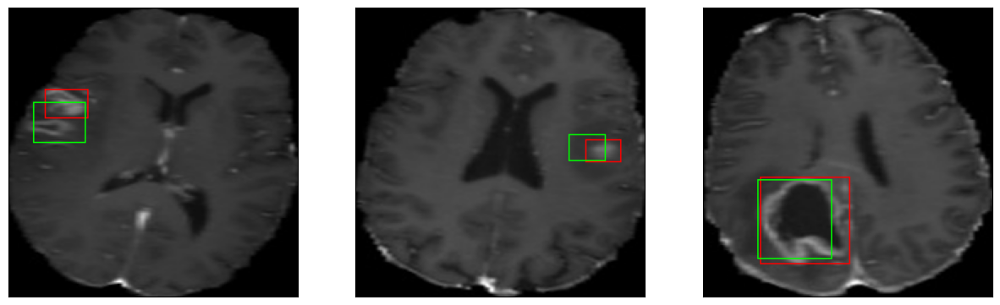

52/52 [==============================] - 23s 438ms/step - loss: 4.8338 - IoU: 0.6646 - val_loss: 6.4325 - val_IoU: 0.6373
Epoch 66/100
52/52 [==============================] - ETA: 0s - loss: 4.7945 - IoU: 0.6727
Epoch 66: val_IoU did not improve from 0.63808
8/8 [==============================] - 1s 157ms/step


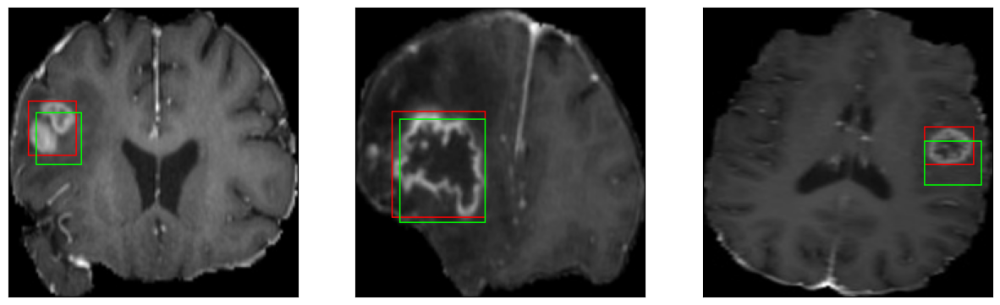

52/52 [==============================] - 22s 431ms/step - loss: 4.7945 - IoU: 0.6727 - val_loss: 8.5508 - val_IoU: 0.4914
Epoch 67/100
52/52 [==============================] - ETA: 0s - loss: 4.6456 - IoU: 0.6750
Epoch 67: val_IoU improved from 0.63808 to 0.64558, saving model to ./model_checkpoint_RESNET/model_RESNET.h5
8/8 [==============================] - 1s 155ms/step


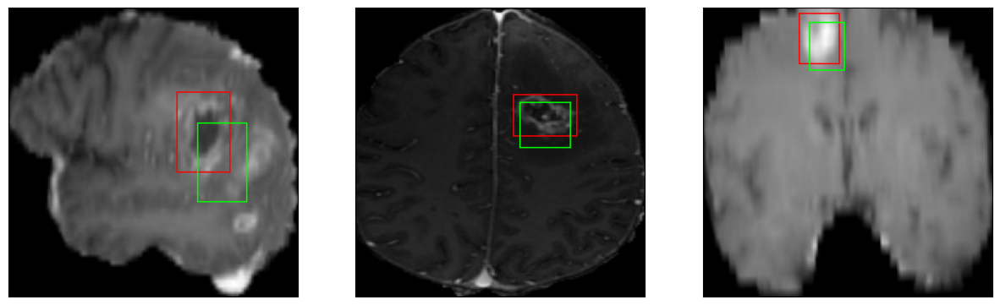

52/52 [==============================] - 35s 677ms/step - loss: 4.6456 - IoU: 0.6750 - val_loss: 6.5731 - val_IoU: 0.6456
Epoch 68/100
52/52 [==============================] - ETA: 0s - loss: 4.4412 - IoU: 0.6902
Epoch 68: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 166ms/step


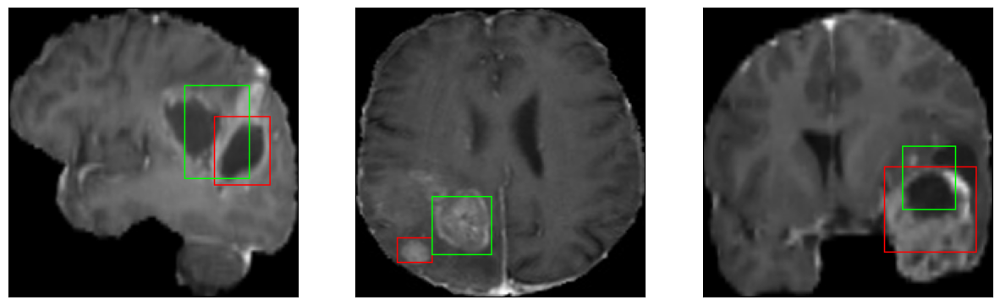

52/52 [==============================] - 23s 443ms/step - loss: 4.4412 - IoU: 0.6902 - val_loss: 6.7763 - val_IoU: 0.6238
Epoch 69/100
52/52 [==============================] - ETA: 0s - loss: 4.5685 - IoU: 0.6794
Epoch 69: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 154ms/step


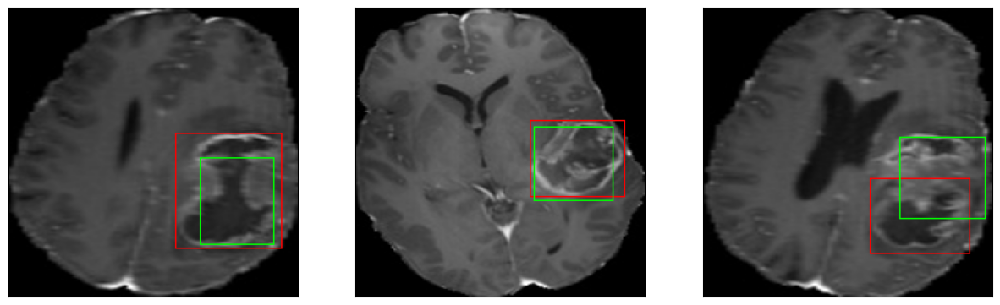

52/52 [==============================] - 23s 435ms/step - loss: 4.5685 - IoU: 0.6794 - val_loss: 6.5404 - val_IoU: 0.6348
Epoch 70/100
52/52 [==============================] - ETA: 0s - loss: 4.5403 - IoU: 0.6781
Epoch 70: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 157ms/step


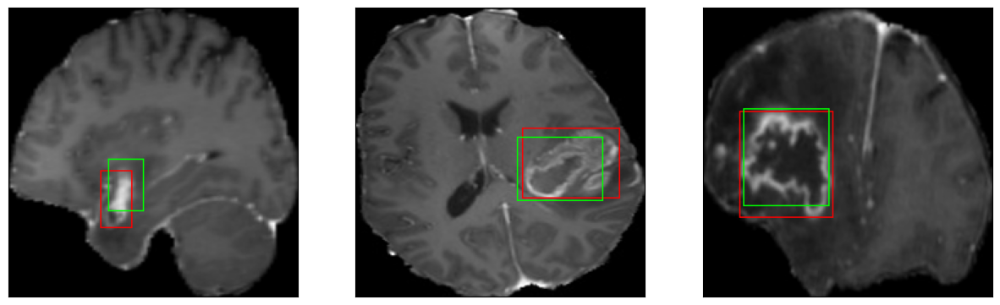

52/52 [==============================] - 22s 429ms/step - loss: 4.5403 - IoU: 0.6781 - val_loss: 7.7248 - val_IoU: 0.5935
Epoch 71/100
52/52 [==============================] - ETA: 0s - loss: 4.5126 - IoU: 0.6793
Epoch 71: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 164ms/step


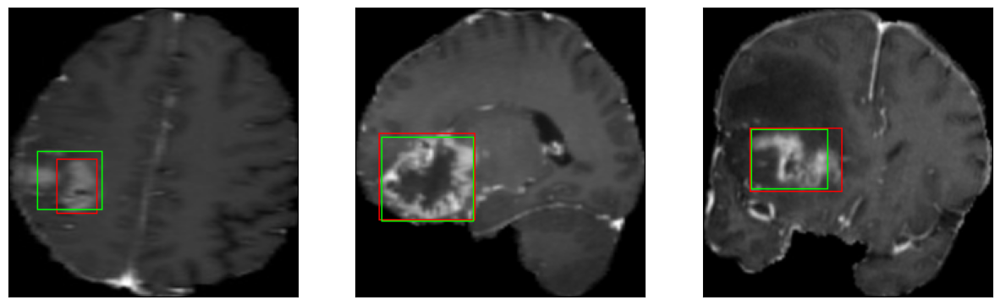

52/52 [==============================] - 23s 436ms/step - loss: 4.5126 - IoU: 0.6793 - val_loss: 6.5754 - val_IoU: 0.6283
Epoch 72/100
52/52 [==============================] - ETA: 0s - loss: 4.4492 - IoU: 0.6888
Epoch 72: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 155ms/step


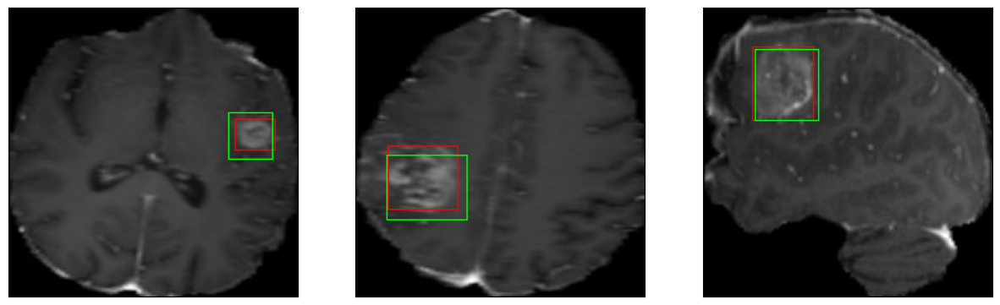

52/52 [==============================] - 23s 440ms/step - loss: 4.4492 - IoU: 0.6888 - val_loss: 7.1387 - val_IoU: 0.5797
Epoch 73/100
52/52 [==============================] - ETA: 0s - loss: 4.3848 - IoU: 0.6871
Epoch 73: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 155ms/step


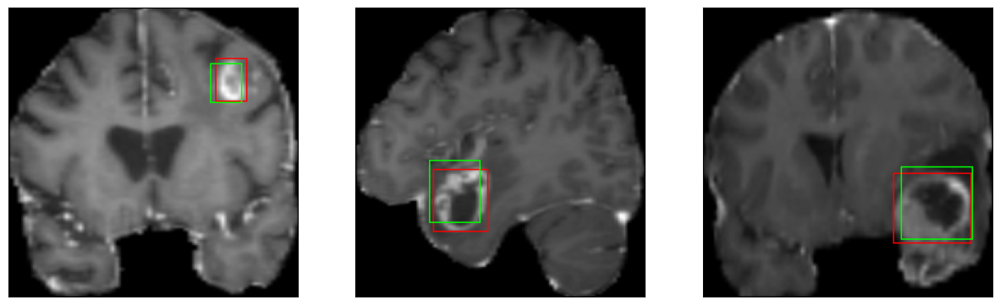

52/52 [==============================] - 22s 429ms/step - loss: 4.3848 - IoU: 0.6871 - val_loss: 6.8226 - val_IoU: 0.5808
Epoch 74/100
52/52 [==============================] - ETA: 0s - loss: 4.4759 - IoU: 0.6770
Epoch 74: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 158ms/step


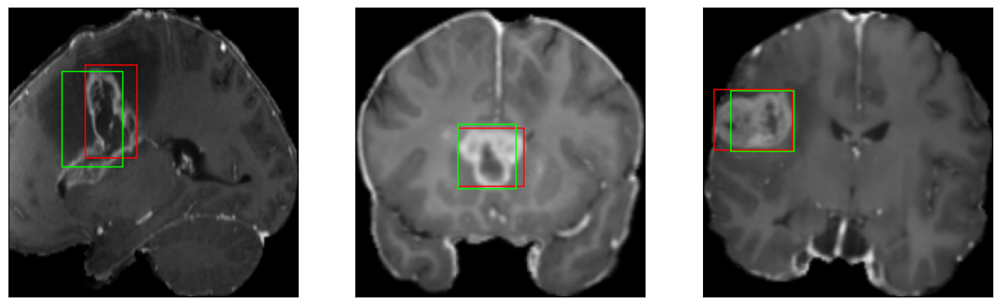

52/52 [==============================] - 23s 437ms/step - loss: 4.4759 - IoU: 0.6770 - val_loss: 6.6155 - val_IoU: 0.6298
Epoch 75/100
52/52 [==============================] - ETA: 0s - loss: 4.4903 - IoU: 0.6789
Epoch 75: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 161ms/step


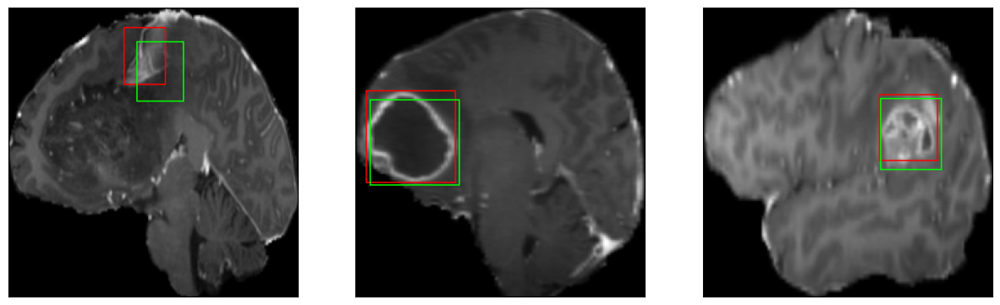

52/52 [==============================] - 23s 436ms/step - loss: 4.4903 - IoU: 0.6789 - val_loss: 6.6557 - val_IoU: 0.6287
Epoch 76/100
52/52 [==============================] - ETA: 0s - loss: 4.6811 - IoU: 0.6835
Epoch 76: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 160ms/step


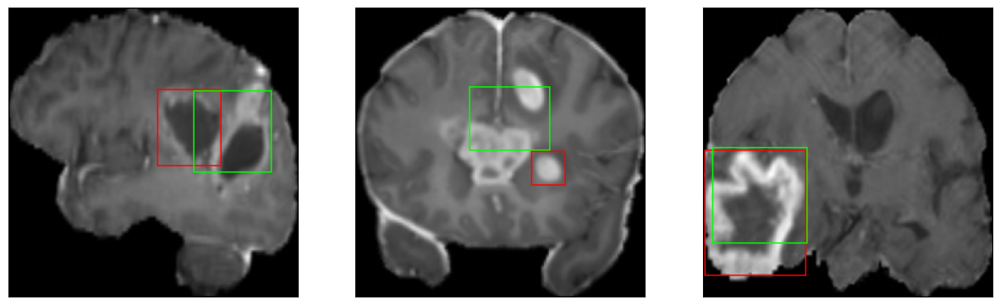

52/52 [==============================] - 23s 443ms/step - loss: 4.6811 - IoU: 0.6835 - val_loss: 7.7255 - val_IoU: 0.6076
Epoch 77/100
52/52 [==============================] - ETA: 0s - loss: 4.7359 - IoU: 0.6714
Epoch 77: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 164ms/step


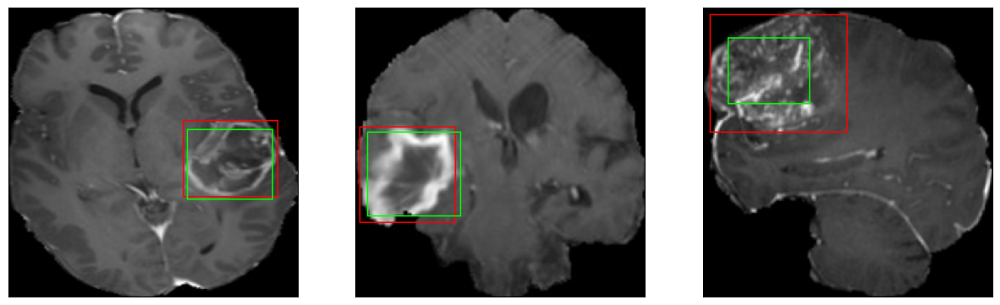

52/52 [==============================] - 23s 435ms/step - loss: 4.7359 - IoU: 0.6714 - val_loss: 6.8889 - val_IoU: 0.6186
Epoch 78/100
52/52 [==============================] - ETA: 0s - loss: 4.6508 - IoU: 0.6680
Epoch 78: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 160ms/step


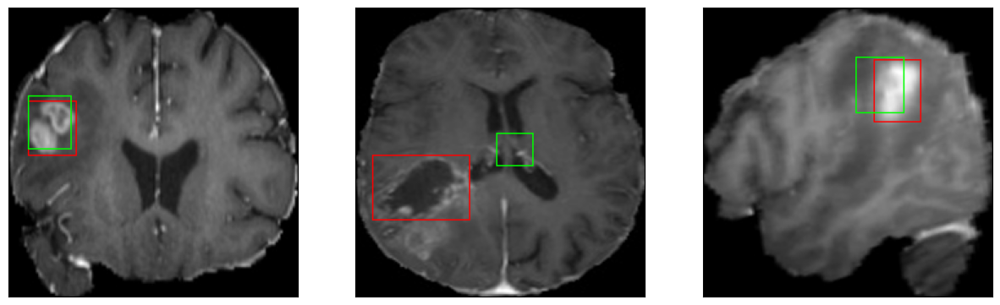

52/52 [==============================] - 22s 429ms/step - loss: 4.6508 - IoU: 0.6680 - val_loss: 8.3295 - val_IoU: 0.5434
Epoch 79/100
52/52 [==============================] - ETA: 0s - loss: 4.6233 - IoU: 0.6790
Epoch 79: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 159ms/step


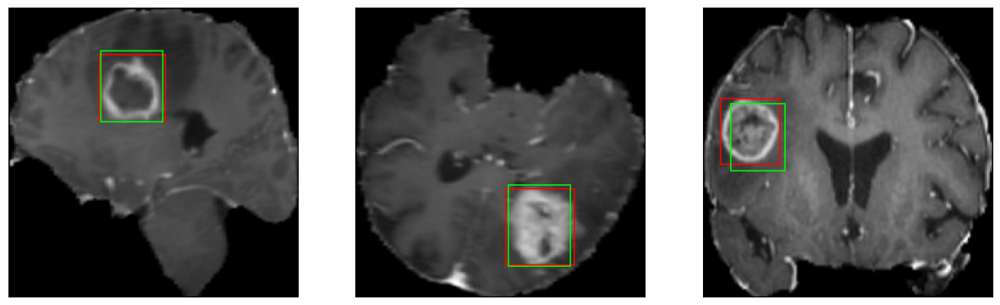

52/52 [==============================] - 23s 440ms/step - loss: 4.6233 - IoU: 0.6790 - val_loss: 7.0971 - val_IoU: 0.6010
Epoch 80/100
52/52 [==============================] - ETA: 0s - loss: 4.3302 - IoU: 0.6920
Epoch 80: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 156ms/step


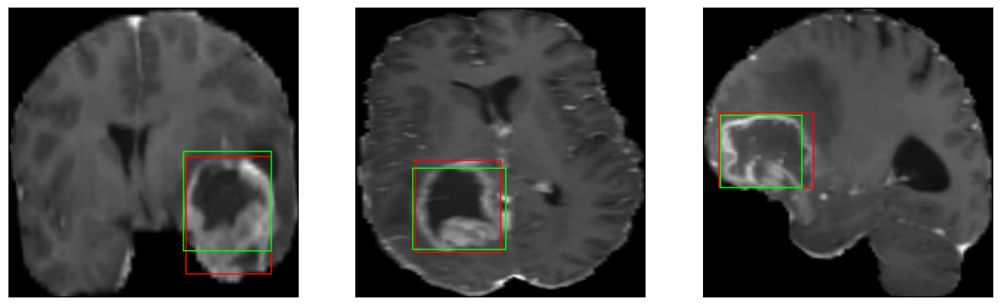

52/52 [==============================] - 22s 433ms/step - loss: 4.3302 - IoU: 0.6920 - val_loss: 6.7671 - val_IoU: 0.6084
Epoch 81/100
52/52 [==============================] - ETA: 0s - loss: 4.5937 - IoU: 0.6747
Epoch 81: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 160ms/step


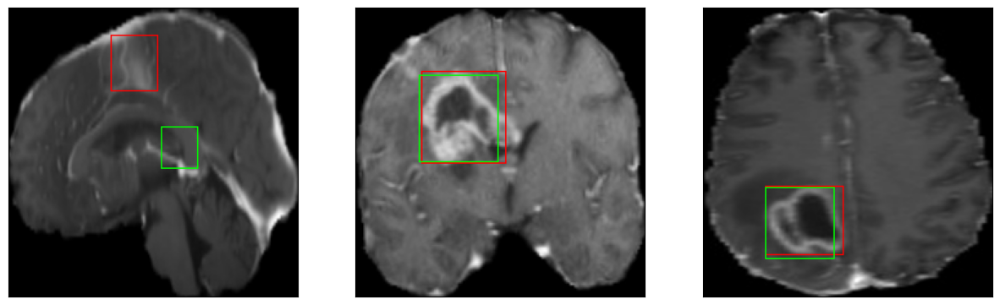

52/52 [==============================] - 23s 441ms/step - loss: 4.5937 - IoU: 0.6747 - val_loss: 6.7895 - val_IoU: 0.6251
Epoch 82/100
52/52 [==============================] - ETA: 0s - loss: 4.3387 - IoU: 0.6979
Epoch 82: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 155ms/step


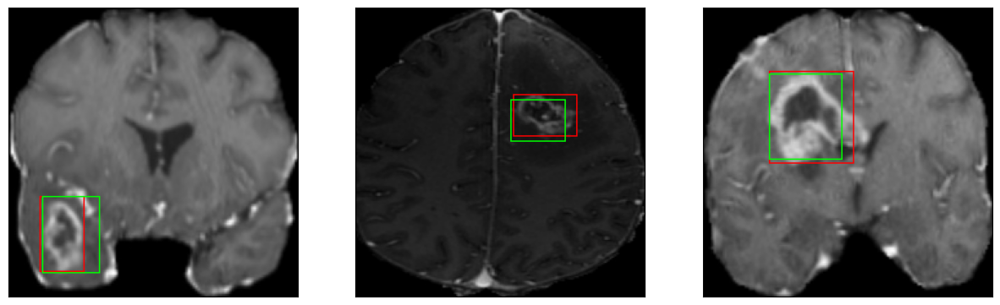

52/52 [==============================] - 23s 438ms/step - loss: 4.3387 - IoU: 0.6979 - val_loss: 6.6784 - val_IoU: 0.6092
Epoch 83/100
52/52 [==============================] - ETA: 0s - loss: 4.4185 - IoU: 0.6910
Epoch 83: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 156ms/step


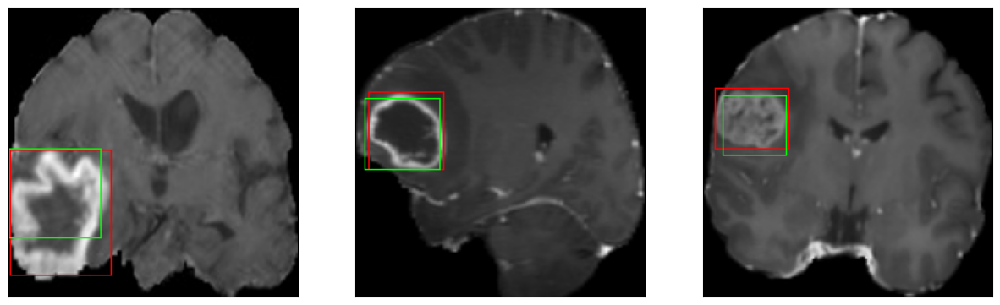

52/52 [==============================] - 22s 435ms/step - loss: 4.4185 - IoU: 0.6910 - val_loss: 7.2760 - val_IoU: 0.5790
Epoch 84/100
52/52 [==============================] - ETA: 0s - loss: 4.3813 - IoU: 0.6827
Epoch 84: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 161ms/step


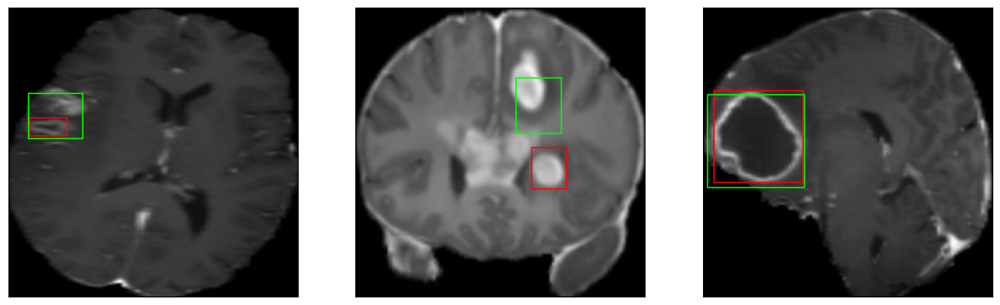

52/52 [==============================] - 23s 435ms/step - loss: 4.3813 - IoU: 0.6827 - val_loss: 7.2325 - val_IoU: 0.6105
Epoch 85/100
52/52 [==============================] - ETA: 0s - loss: 4.4039 - IoU: 0.6871
Epoch 85: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 159ms/step


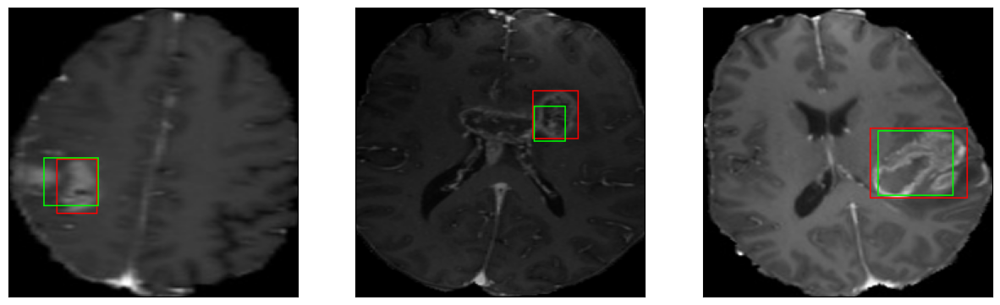

52/52 [==============================] - 23s 439ms/step - loss: 4.4039 - IoU: 0.6871 - val_loss: 6.9079 - val_IoU: 0.6097
Epoch 86/100
52/52 [==============================] - ETA: 0s - loss: 4.4332 - IoU: 0.6816
Epoch 86: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 155ms/step


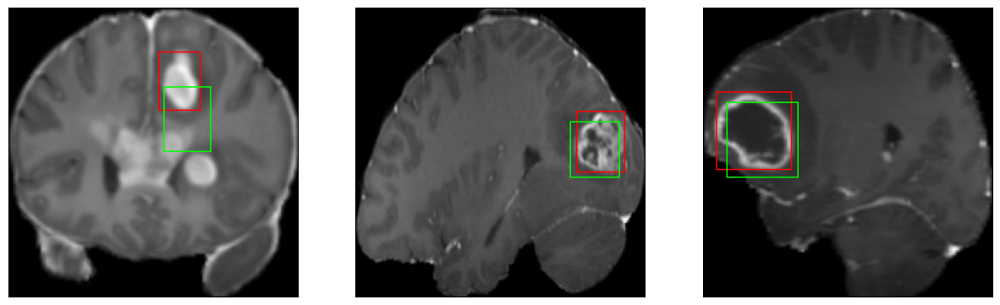

52/52 [==============================] - 22s 433ms/step - loss: 4.4332 - IoU: 0.6816 - val_loss: 7.1300 - val_IoU: 0.5745
Epoch 87/100
52/52 [==============================] - ETA: 0s - loss: 4.3627 - IoU: 0.6856
Epoch 87: val_IoU did not improve from 0.64558
8/8 [==============================] - 1s 157ms/step


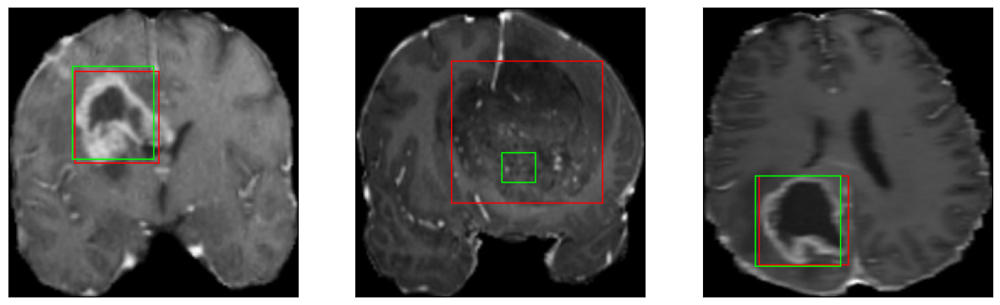

52/52 [==============================] - 22s 434ms/step - loss: 4.3627 - IoU: 0.6856 - val_loss: 6.7256 - val_IoU: 0.6049


In [25]:
hist = model.fit(
        train_dataset,
        epochs=100,
        validation_data = val_dataset,
        callbacks = callbacks_list
        )

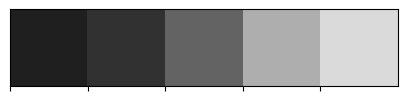

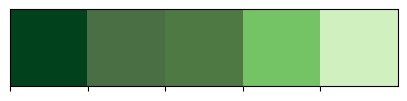

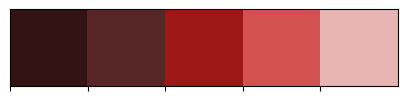

In [26]:
import seaborn as sns
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0']

sns.palplot(colors_dark)
sns.palplot(colors_green)
sns.palplot(colors_red)

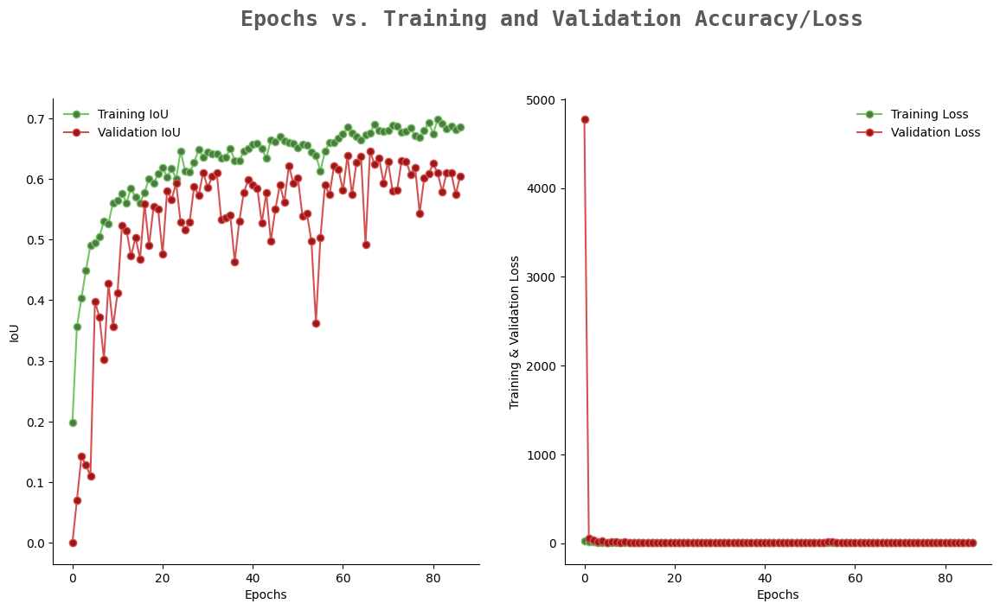

In [28]:
from warnings import filterwarnings
filterwarnings('ignore')

epochs = [i for i in range(87)]
fig, ax = plt.subplots(1,2,figsize=(14,7))
train_acc = hist.history['IoU']
train_loss = hist.history['loss']
val_acc = hist.history['val_IoU']
val_loss = hist.history['val_loss']

fig.text(s='Epochs vs. Training and Validation Accuracy/Loss',size=18,fontweight='bold',
             fontname='monospace',color=colors_dark[1],y=1,x=0.28,alpha=0.8)

sns.despine()
ax[0].plot(epochs, train_acc, marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label = 'Training IoU')
ax[0].plot(epochs, val_acc, marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation IoU')
ax[0].legend(frameon=False)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('IoU')

sns.despine()
ax[1].plot(epochs, train_loss, marker='o',markerfacecolor=colors_green[2],color=colors_green[3],
           label ='Training Loss')
ax[1].plot(epochs, val_loss, marker='o',markerfacecolor=colors_red[2],color=colors_red[3],
           label = 'Validation Loss')
ax[1].legend(frameon=False)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Training & Validation Loss')

fig.show()

In [29]:
model = tf.keras.models.load_model('./model_checkpoint_RESNET/model_RESNET.h5', compile=False)

In [30]:
model.compile(
    loss={
        'bb_pred': 'mae'
    },
    optimizer=tf.keras.optimizers.Adam(1e-3),
    metrics=[IoU]
    
)

In [31]:
model.evaluate(test_dataset)

15/15 [==============================] - 5s 98ms/step - loss: 9.0425 - IoU: 0.5594


[9.042513847351074, 0.5594324469566345]